In [6]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from qmplot import manhattanplot

In [4]:
pathToRegenieData = "regenie_analysis/ukb_bmi/"

In [5]:
# ## Read in association results for BMI

# Read in centralized results
centralized = pd.read_table(pathToRegenieData + "ukb_block_8192_assoc_Y1.regenie", 
                                 delim_whitespace=True,
                                 usecols=['CHROM','GENPOS', 'ID', 'LOG10P'] # log10P is -log(P)
                                )
centralized.rename(columns={'CHROM': '#CHROM', 'GENPOS':'POS'}, inplace=True)
centralized['P'] = -1 * centralized['LOG10P']
centralized['P'] = 10 ** centralized['P']
centralized = centralized.dropna(how="any", axis=0, subset=['P'])  # clean data
centralized[['#CHROM']] = centralized[['#CHROM']].astype(str)

# Read in meta-analysis results
metaRandom = pd.read_table(pathToRegenieData + "plink.meta", 
                                 delim_whitespace=True,
                                 usecols=['CHR', 'BP', 'SNP', 'P(R)']
                                )
metaRandom = metaRandom.dropna(how="any", axis=0, subset=['P(R)']) # clean data
metaRandom.rename(columns={'CHR': '#CHROM', 'BP':'POS', 'SNP':'ID', 'P(R)':'P'}, inplace=True)
metaRandom[['#CHROM']] = metaRandom[['#CHROM']].astype(str)

# Read in meta-analysis results
metaFixed = pd.read_table(pathToRegenieData + "plink.meta", 
                                 delim_whitespace=True,
                                 usecols=['CHR', 'BP', 'SNP', 'P']
                                )
metaFixed = metaFixed.dropna(how="any", axis=0, subset=['P'])  # clean data
metaFixed.rename(columns={'CHR': '#CHROM', 'BP':'POS', 'SNP':'ID',}, inplace=True)
metaFixed[['#CHROM']] = metaFixed[['#CHROM']].astype(str)

In [25]:
print(centralized.shape)
centralized.head(5)

(581927, 5)


,#CHROM,POS,ID,LOG10P,P
0,1,756604,rs3131962,0.372333,0.424294
1,1,768448,rs12562034,2.292680,0.005097
2,1,779322,rs4040617,0.566094,0.271585
3,1,801536,rs79373928,0.453009,0.352364
4,1,808631,rs11240779,0.478928,0.331949


/Users/medupall/anaconda3/lib/python3.8/site-packages/qmplot/modules/_manhattan.py:242: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


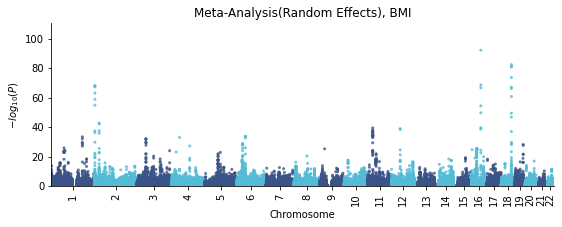

/Users/medupall/anaconda3/lib/python3.8/site-packages/qmplot/modules/_manhattan.py:242: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


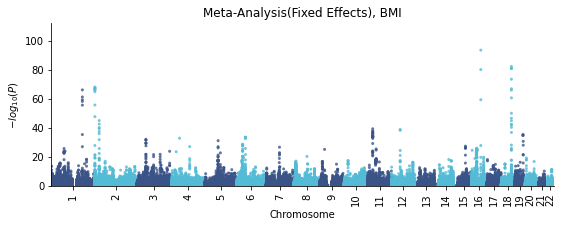

In [20]:
# Meta analysis manhattan plot

threshold = pow(10, -1*100)
manhattanplot(data=metaRandom[metaRandom['P'] >= threshold],
    suggestiveline=None, # Turn off suggestive line
    genomewideline=None, # Turn off suggestive line
    marker = '.',
    xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
    title="Meta-Analysis(Random Effects), BMI"
    )
plt.show()

threshold = pow(10, -1*100)
manhattanplot(data=metaFixed[metaFixed['P'] >= threshold],
    suggestiveline=None, # Turn off suggestive line
    genomewideline=None, # Turn off suggestive line
    marker = '.',
    xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
    title="Meta-Analysis(Fixed Effects), BMI"
    )
plt.show()

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


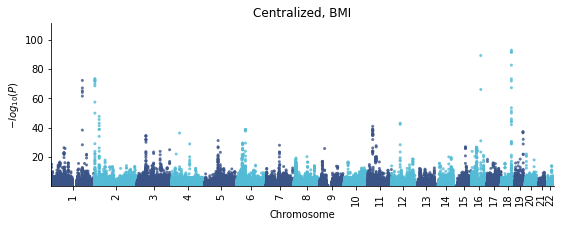

In [26]:
# centralized manhattan plot
threshold = pow(10, -1*100)
manhattanplot(data=centralized[centralized['P'] >= threshold],
    suggestiveline=None, # Turn off suggestive line
    genomewideline=None, # Turn off suggestive line
    marker = '.',
    xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
    title="Centralized, BMI"
    )
plt.show()

0.8541012981999534


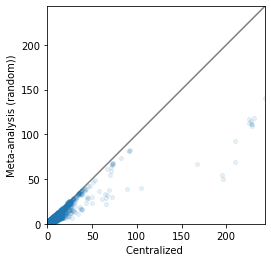

In [6]:
# centralized vs meta-analysis (random)
centralized['-logP'] = centralized['LOG10P']
centralized = centralized.replace([np.inf, -np.inf], np.nan)
centralized = centralized.dropna(how="any", axis=0)

metaRandom['P'] = pd.to_numeric(metaRandom.loc[:, 'P'])
metaRandom['-logP'] = metaRandom.loc[:, 'P'].apply(np.log10)
metaRandom.loc[:, '-logP'] = metaRandom.loc[:, '-logP'].apply(lambda x: x * -1)
metaRandom = metaRandom.replace([np.inf, -np.inf], np.nan)
metaRandom = metaRandom.dropna(how="any", axis=0)

cent_meta_random = pd.merge(centralized, metaRandom, how='inner', on=['#CHROM', 'POS', 'ID']) 
print(np.corrcoef(cent_meta_random['-logP_x'].to_numpy(), cent_meta_random['-logP_y'].to_numpy())[0,1] ** 2)

_, ax = plt.subplots()
lims = [np.min([cent_meta_random['-logP_x'].min(), cent_meta_random['-logP_y'].min()]),  # min of both axes
        np.max([cent_meta_random['-logP_x'].max(), cent_meta_random['-logP_y'].max()]),  # max of both axes
        ]


# plot both limits against eachother
ax.plot(lims, lims, color="gray")
plt.xlim(round(lims[0]), round(lims[1]))
plt.ylim(round(lims[0]), round(lims[1]))
ax.set_aspect('equal', adjustable='box')

plt.xlabel("Centralized ")
plt.ylabel("Meta-analysis (random))")

# plot markers
plt.plot(cent_meta_random['-logP_x'], cent_meta_random['-logP_y'], 'o', alpha=0.1, markersize=4)


plt.show()

0.9795430129737372


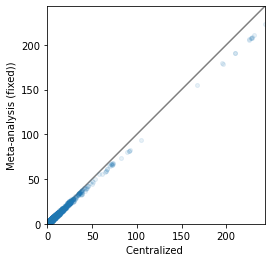

In [7]:
# centralized vs meta-analysis (fixed)
metaFixed['P'] = pd.to_numeric(metaFixed.loc[:, 'P'])
metaFixed['-logP'] = metaFixed.loc[:, 'P'].apply(np.log10)
metaFixed.loc[:, '-logP'] = metaFixed.loc[:, '-logP'].apply(lambda x: x * -1)
metaFixed = metaFixed.replace([np.inf, -np.inf], np.nan)
metaFixed = metaFixed.dropna(how="any", axis=0)

cent_meta_fixed = pd.merge(centralized, metaFixed, how='inner', on=['#CHROM', 'POS', 'ID']) 
print(np.corrcoef(cent_meta_fixed['-logP_x'].to_numpy(), cent_meta_fixed['-logP_y'].to_numpy())[0,1] ** 2)

_, ax = plt.subplots()
lims = [np.min([cent_meta_fixed['-logP_x'].min(), cent_meta_fixed['-logP_y'].min()]),  # min of both axes
        np.max([cent_meta_fixed['-logP_x'].max(), cent_meta_fixed['-logP_y'].max()]),  # max of both axes
        ]


# plot both limits against eachother
ax.plot(lims, lims, color="gray")
plt.xlim(round(lims[0]), round(lims[1]))
plt.ylim(round(lims[0]), round(lims[1]))
ax.set_aspect('equal', adjustable='box')

plt.xlabel("Centralized ")
plt.ylabel("Meta-analysis (fixed))")

# plot markers
plt.plot(cent_meta_fixed['-logP_x'], cent_meta_fixed['-logP_y'], 'o', alpha=0.1, markersize=4)


plt.show()

In [7]:
phenoCodes = {
1: "BMI",
2: "Albumin",
3: "Alkaline phosphatase",
4: "Alanine aminotransferase",
5: "Apolipoprotein A",
6: "Apolipoprotein B",
7: "Aspartate aminotransferase",
8: "Direct bilirubin",
9:"Urea",
10:"Calcium",
11:"Cholesterol",
12:"Creatinine",
13:"C-reactive protein",
14:"Cystatin C",
15:"Gamma glutamyltransferase",
16:"Glucose",
17:"Glycated haemoglobin (HbA1c)",
18:"HDL cholesterol",
19:"IGF-1",
20:"LDL direct",
21:"Lipoprotein A",
22:"Oestradiol",
23:"Phosphate",
24:"Rheumatoid factor",
25:"SHBG",
26:"Total bilirubin",
27:"Testosterone",
28:"Total protein",
29:"Triglycerides",
30:"Urate",
31:"Vitamin"
}

In [5]:
# Extended analysis

pathToExtendedMetaAnalysis = "regenie_analysis/ukb_extended_assoc/"
pathToExtendedCentralizedAnalysis = "../jeffchen/regenie_analysis/"
centralized_extended = {}
metaRandom_extended = {}
metaFixed_extended = {}

for phenoIndex in range(1,30):
    # Read in centralized results
    centralizedFile = pathToExtendedCentralizedAnalysis + "ukb_block_8192_extended_assoc_Y" + str(phenoIndex) + ".regenie"
    centralized_extended[phenoIndex] = pd.read_table(centralizedFile, 
                                     delim_whitespace=True,
                                     usecols=['CHROM','GENPOS', 'ID', 'LOG10P'] # log10P is -log(P)
                                    )
    centralized_extended[phenoIndex].rename(columns={'CHROM': '#CHROM', 'GENPOS':'POS'}, inplace=True)
    centralized_extended[phenoIndex]['P'] = -1 * centralized_extended[phenoIndex]['LOG10P']
    centralized_extended[phenoIndex]['P'] = 10 ** centralized_extended[phenoIndex]['P']
    centralized_extended[phenoIndex] = centralized_extended[phenoIndex].dropna(how="any", axis=0, subset=['P'])  # clean data
    centralized_extended[phenoIndex][['#CHROM']] = centralized_extended[phenoIndex][['#CHROM']].astype(str)

    # Read in meta-analysis results
    metaFile = pathToExtendedMetaAnalysis + "ukb_extended_assoc_Y" + str(phenoIndex) + ".meta"
    metaRandom_extended[phenoIndex] = pd.read_table(metaFile, 
                                     delim_whitespace=True,
                                     usecols=['CHR', 'BP', 'SNP', 'P(R)']
                                    )
    metaRandom_extended[phenoIndex] = metaRandom_extended[phenoIndex].dropna(how="any", axis=0, subset=['P(R)']) # clean data
    metaRandom_extended[phenoIndex].rename(columns={'CHR': '#CHROM', 'BP':'POS', 'SNP':'ID', 'P(R)':'P'}, inplace=True)
    metaRandom_extended[phenoIndex][['#CHROM']] = metaRandom_extended[phenoIndex][['#CHROM']].astype(str)

    # Read in meta-analysis results
    metaFixed_extended[phenoIndex] = pd.read_table(metaFile, 
                                     delim_whitespace=True,
                                     usecols=['CHR', 'BP', 'SNP', 'P']
                                    )
    metaFixed_extended[phenoIndex] = metaFixed_extended[phenoIndex].dropna(how="any", axis=0, subset=['P'])  # clean data
    metaFixed_extended[phenoIndex].rename(columns={'CHR': '#CHROM', 'BP':'POS', 'SNP':'ID',}, inplace=True)
    metaFixed_extended[phenoIndex][['#CHROM']] = metaFixed_extended[phenoIndex][['#CHROM']].astype(str)

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


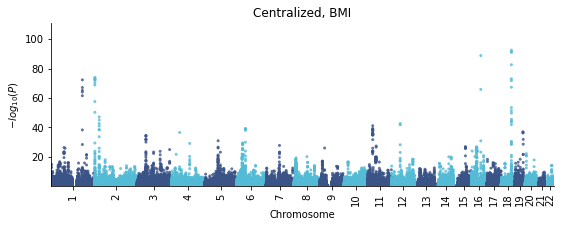

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


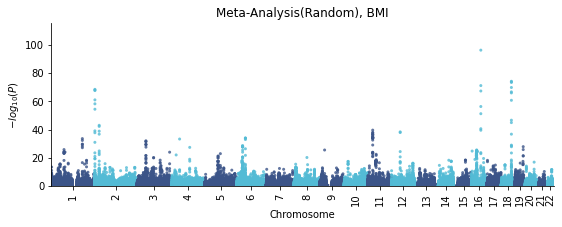

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


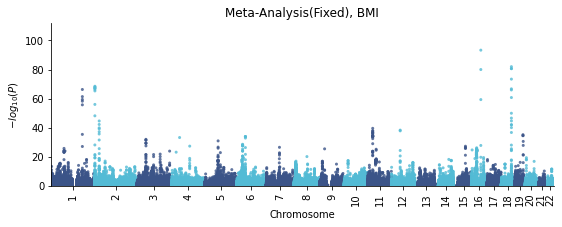

0.8619432059648651


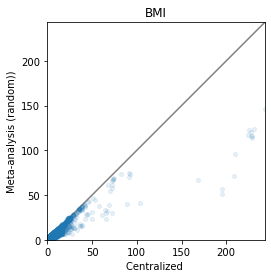

0.9796109524795691


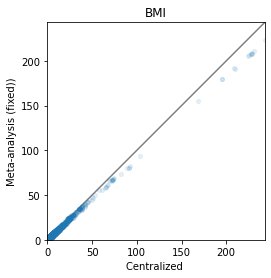

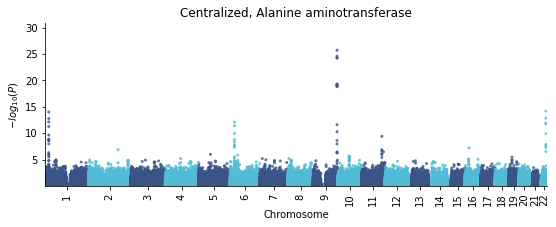

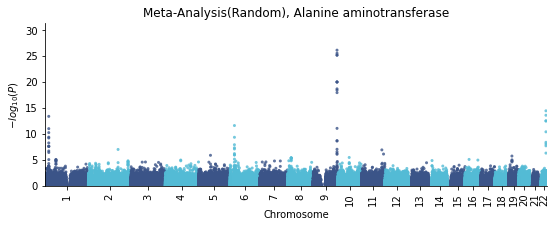

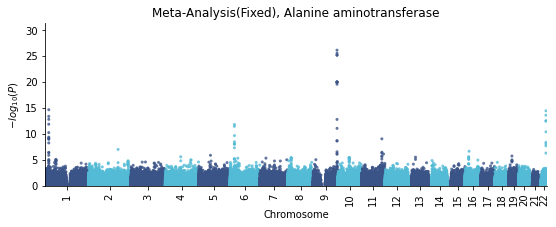

0.8787287805297315


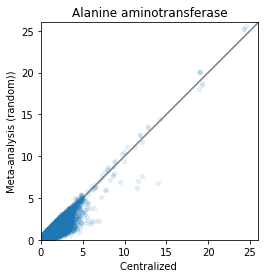

0.9540248929106387


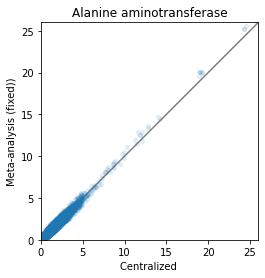

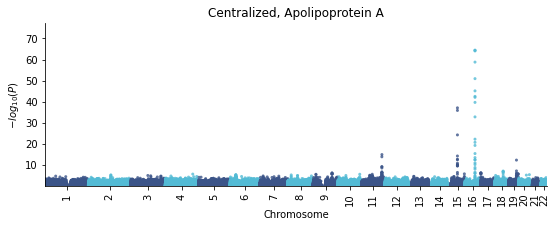

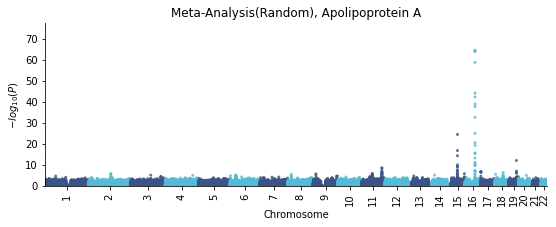

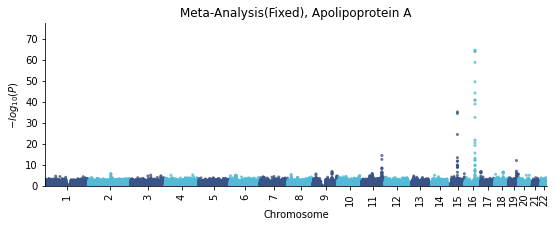

0.8889353832766488


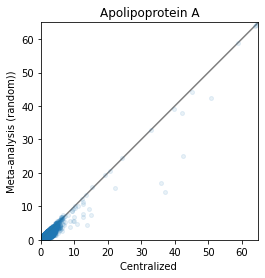

0.9400865747264144


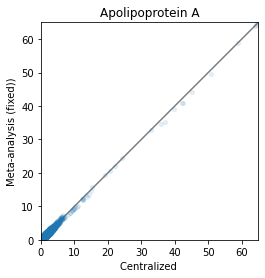

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


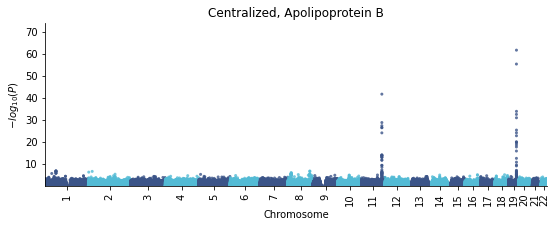

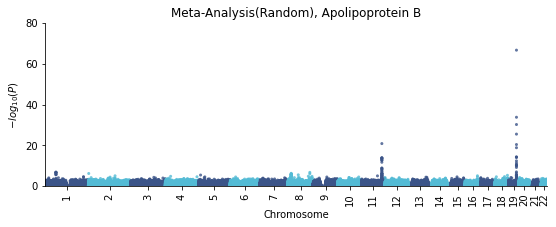

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


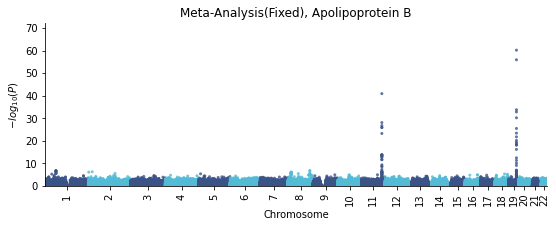

0.8548269212575259


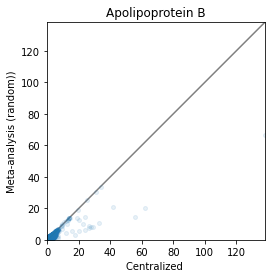

0.9820506813855904


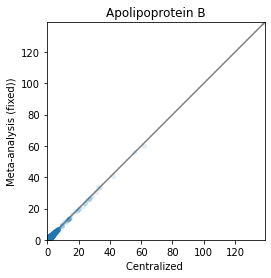

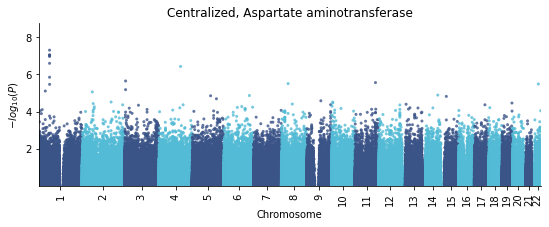

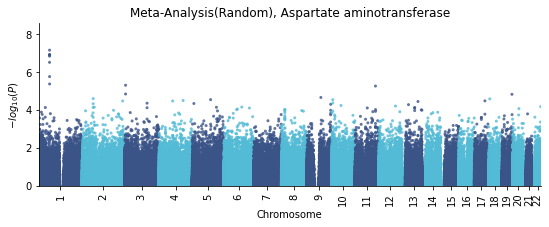

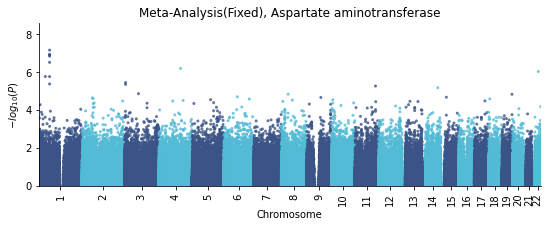

0.8898903847610156


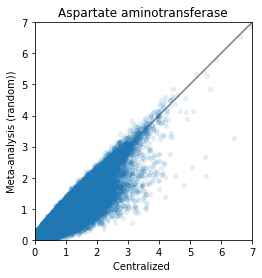

0.953837376544634


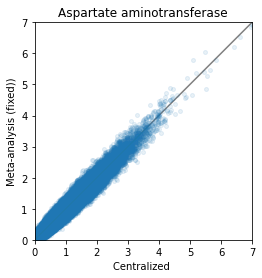

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


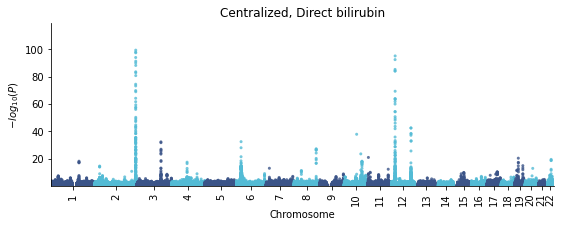

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


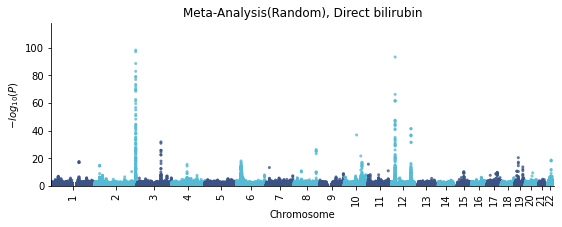

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


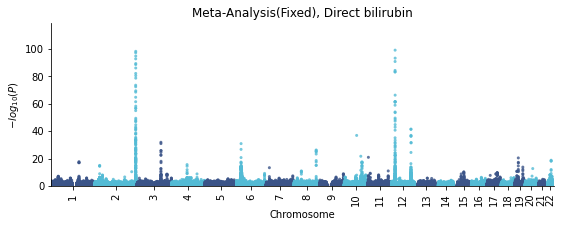

0.9620285947933209


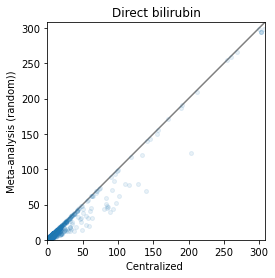

0.9962353104329849


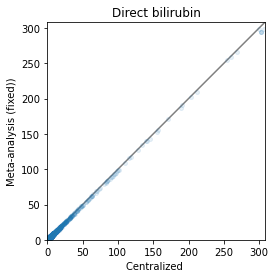

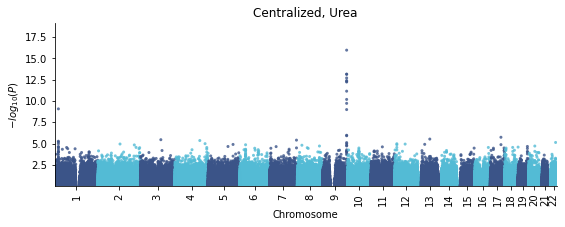

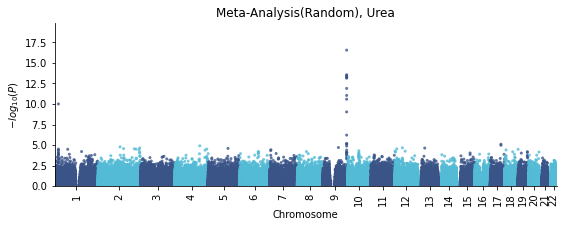

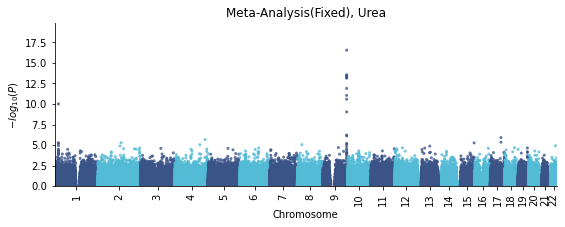

0.8297566229549377


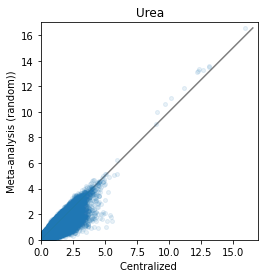

0.886650081632909


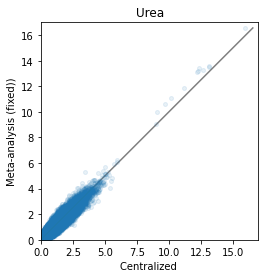

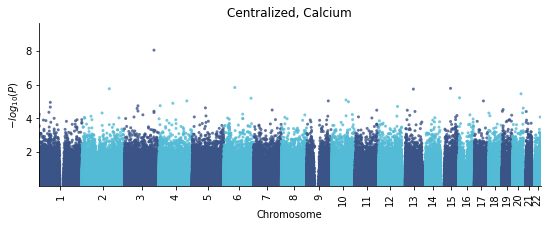

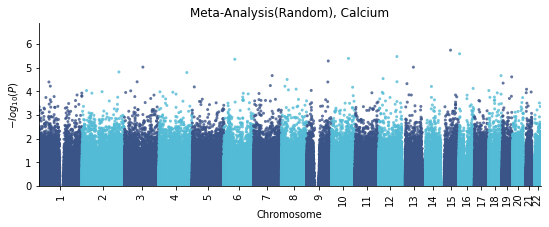

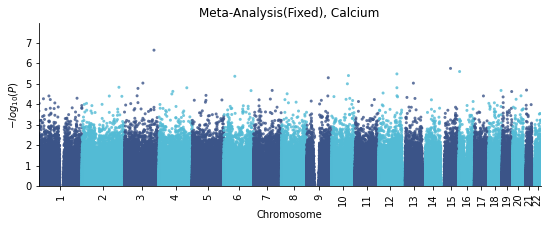

0.8131701994924319


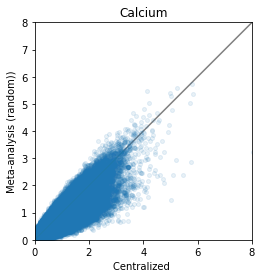

0.842017455258379


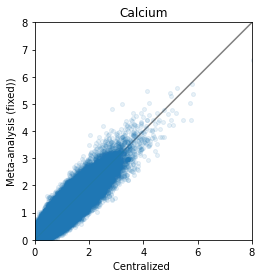

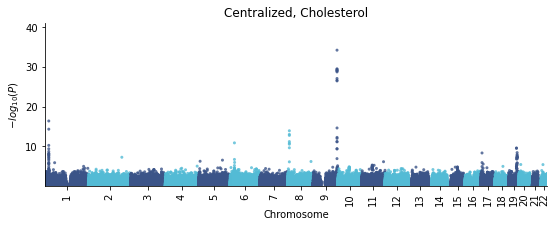

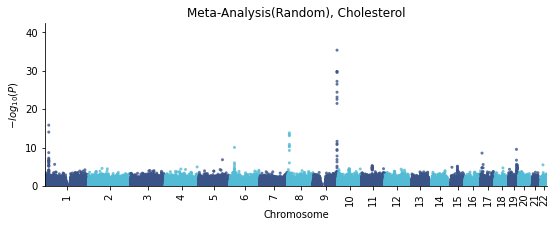

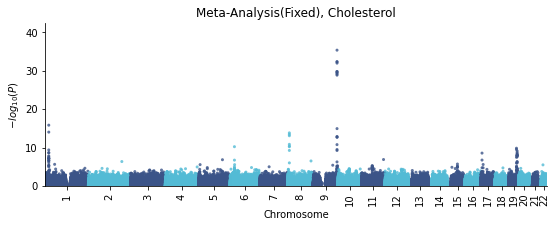

0.8698906829626838


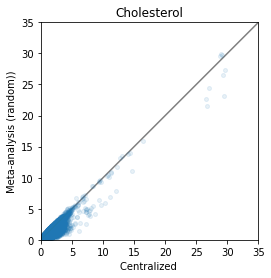

0.9369679956578347


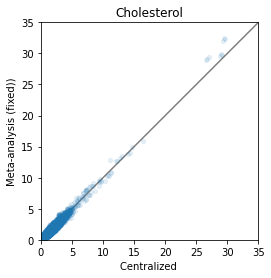

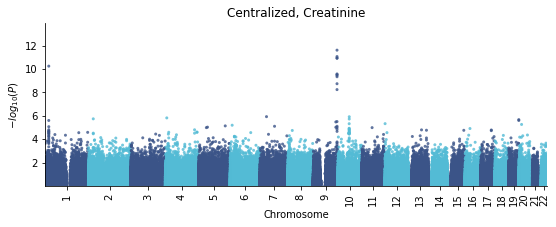

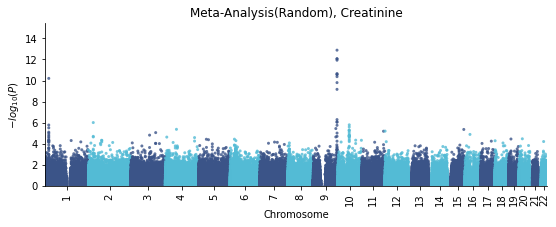

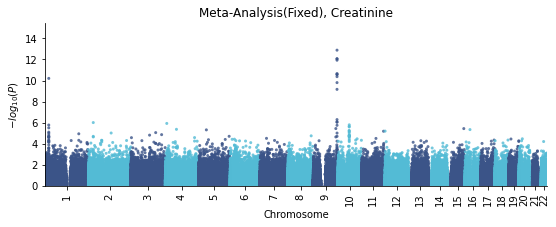

0.7943716147075363


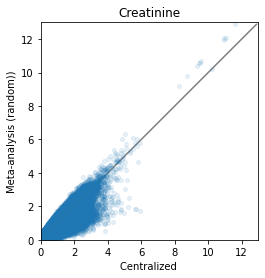

0.8451028612978142


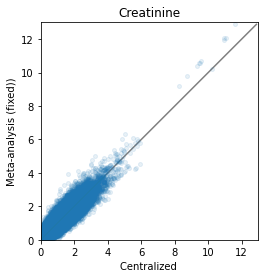

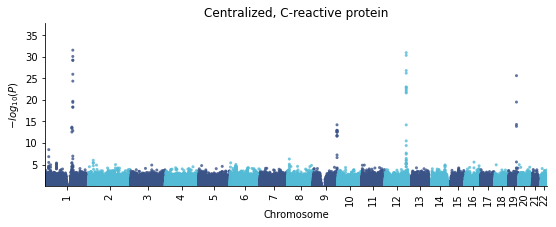

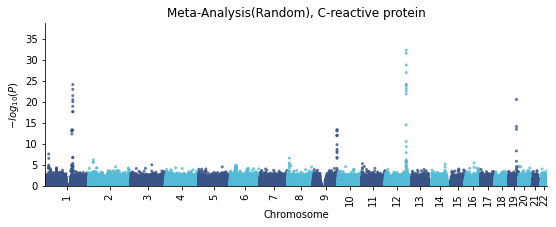

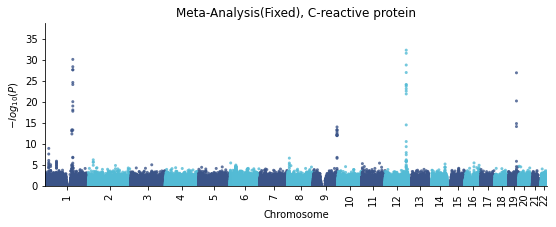

0.8828960532802179


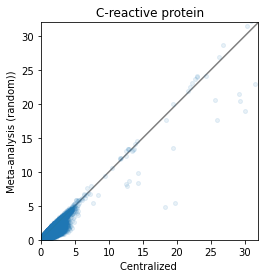

0.9485813009966279


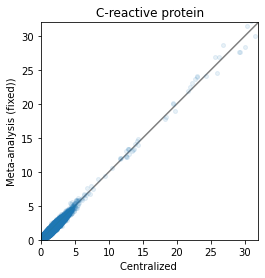

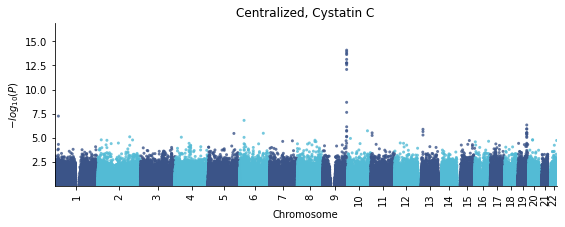

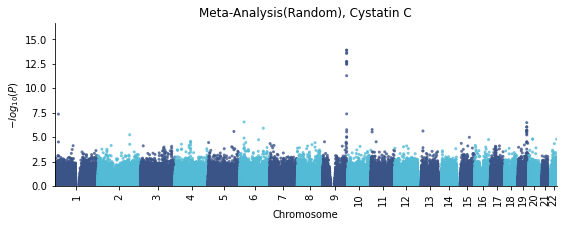

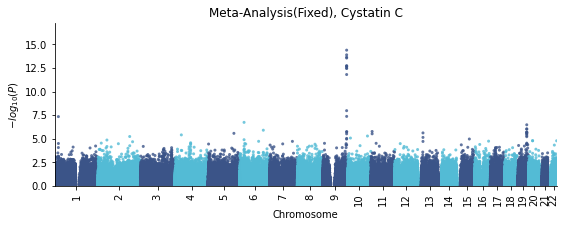

0.8954936139140244


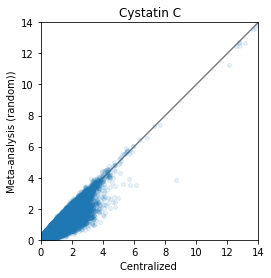

0.9572444668163008


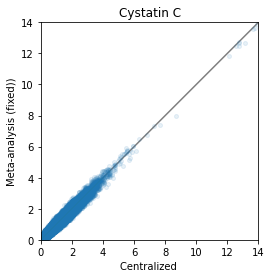

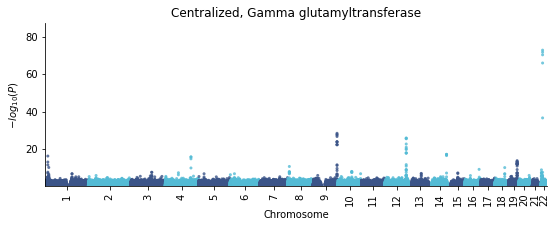

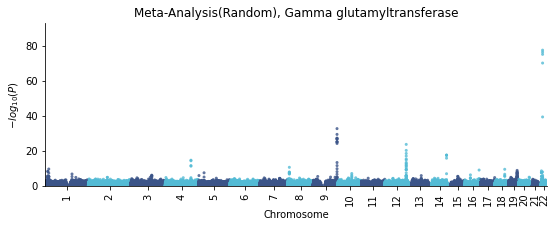

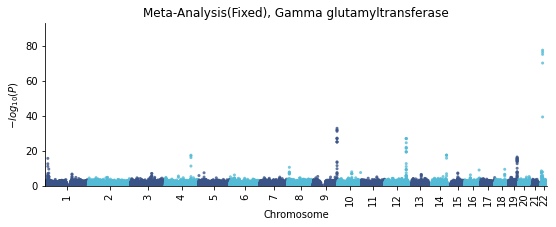

0.8603289180289441


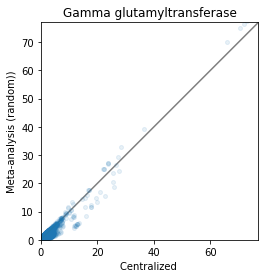

0.9096517799313


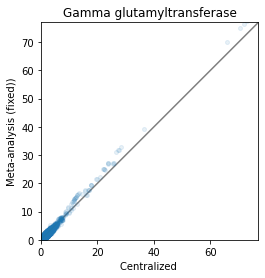

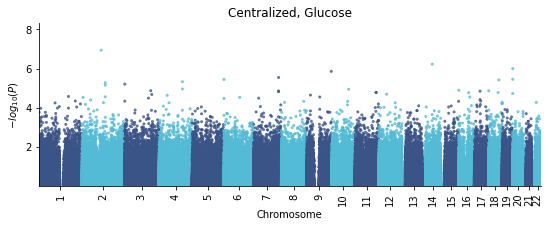

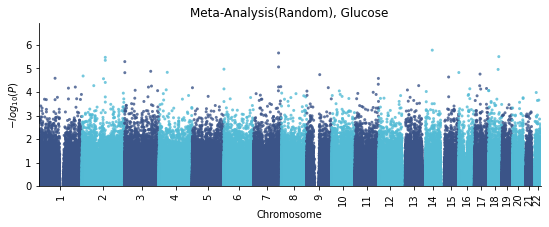

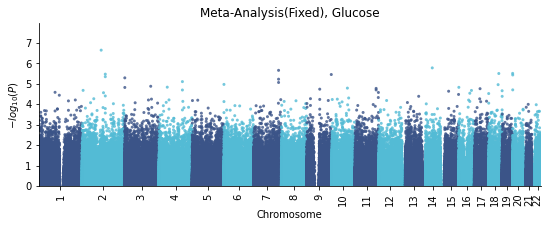

0.8618028848351718


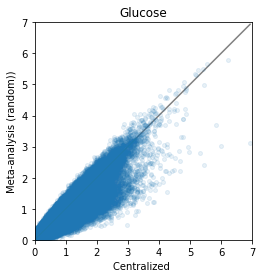

0.8976160906718004


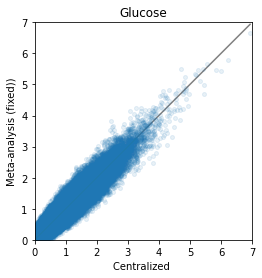

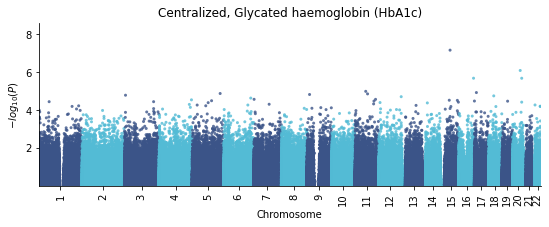

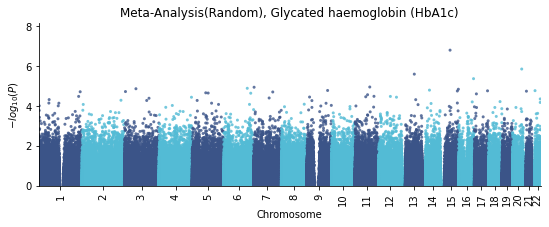

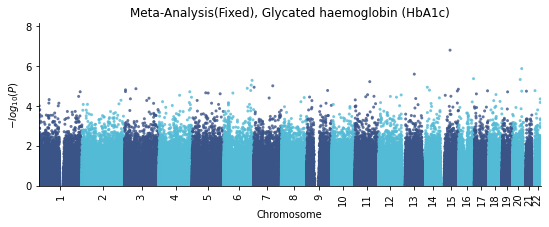

0.849502412022467


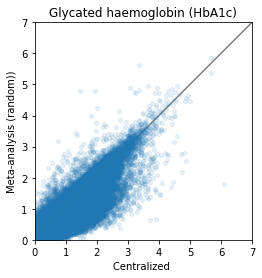

0.9265162881143026


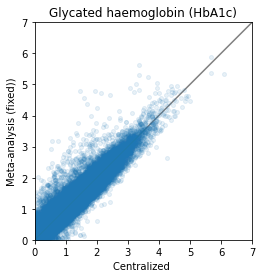

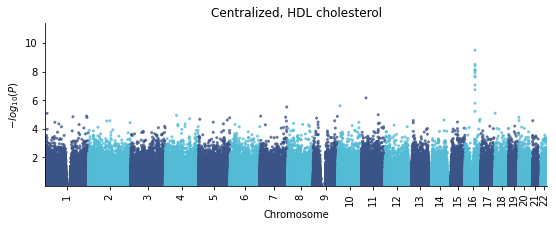

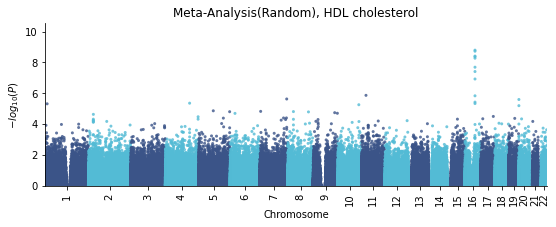

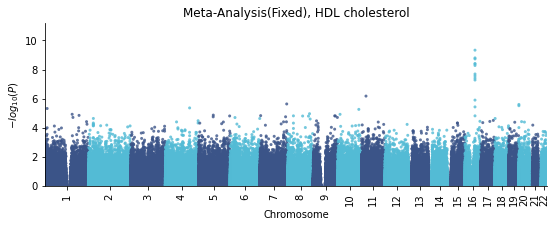

0.8475831347701799


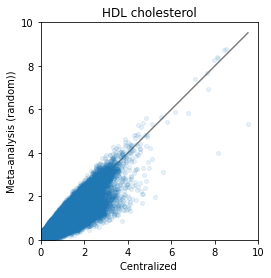

0.8875604323650822


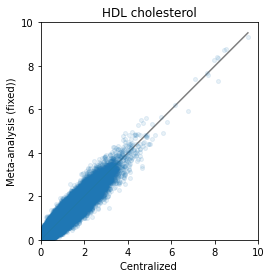

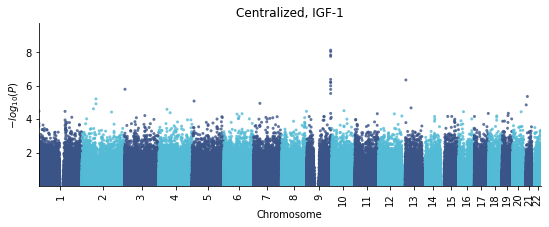

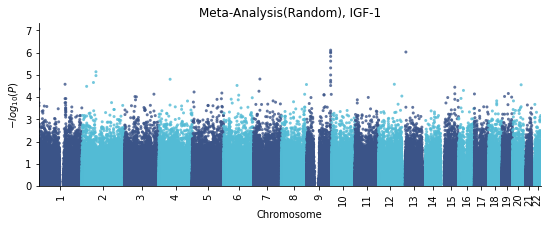

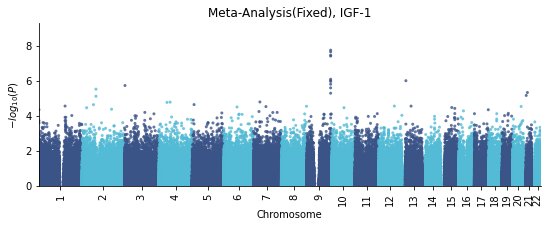

0.9032238649888171


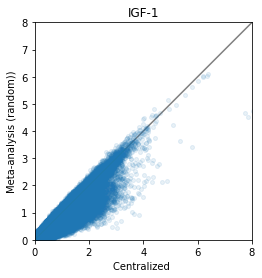

0.9658794075733491


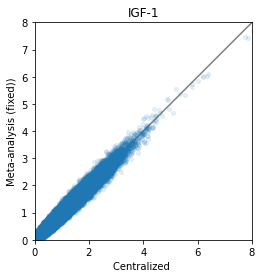

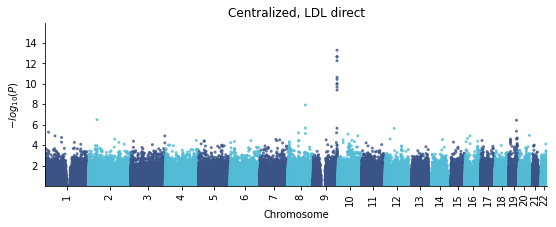

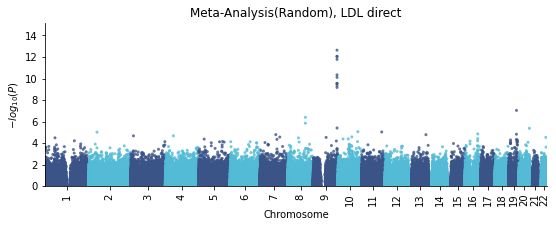

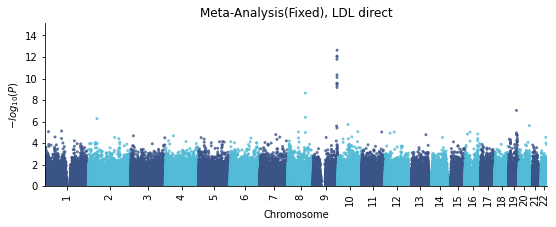

0.8378486788411607


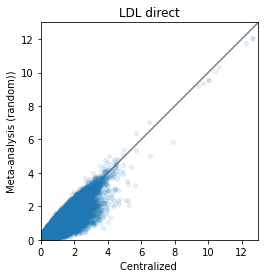

0.8949601500304198


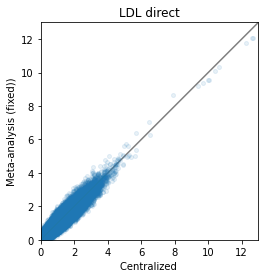

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


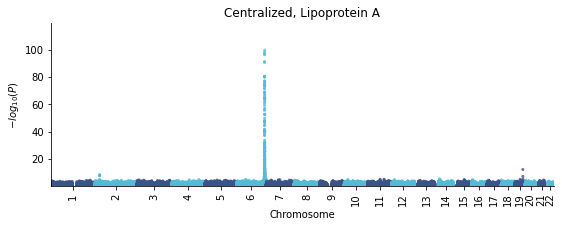

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


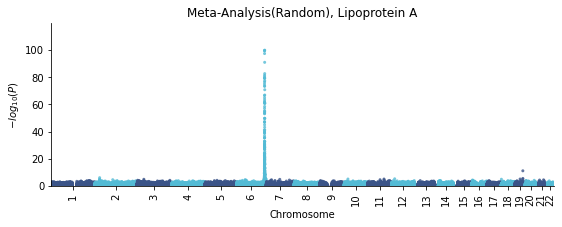

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


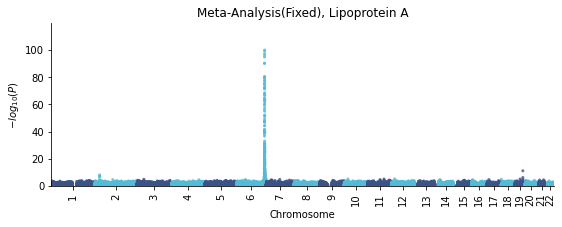

0.6006887371536919


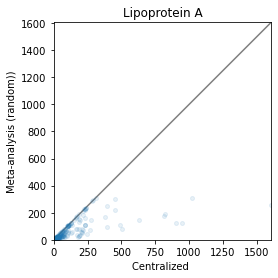

0.9960841488116513


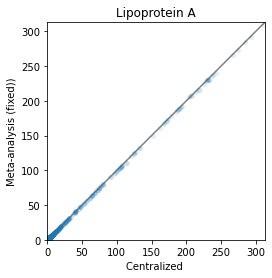

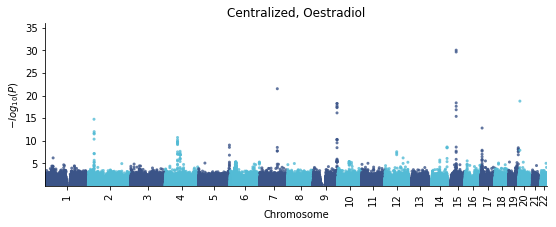

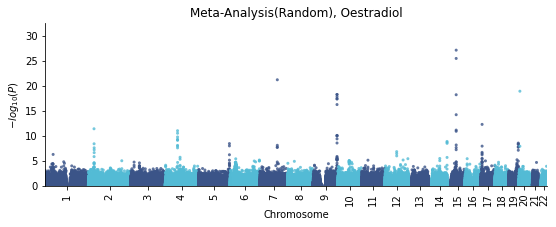

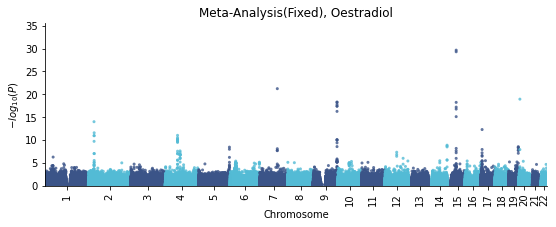

0.9179033512215664


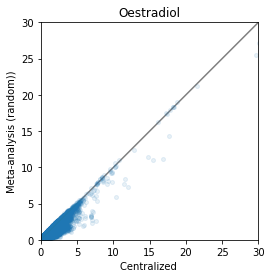

0.9809005361146707


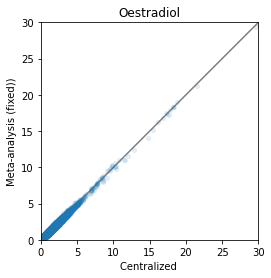

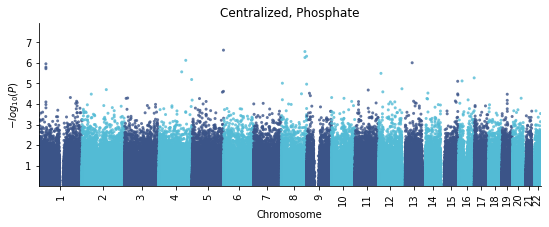

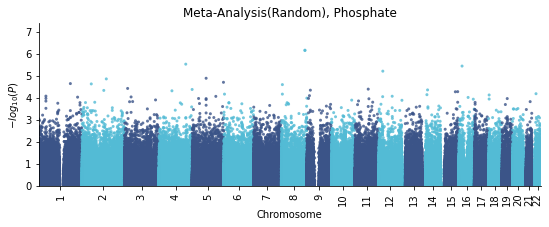

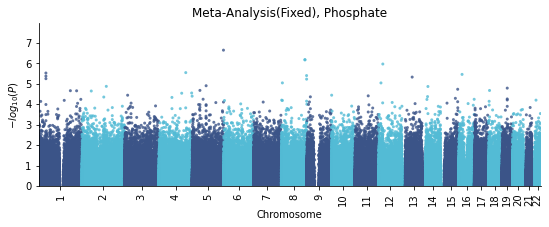

0.8404868885033597


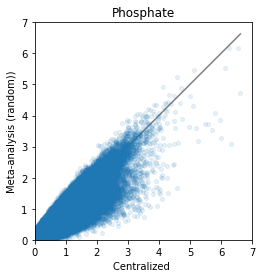

0.8836867587707585


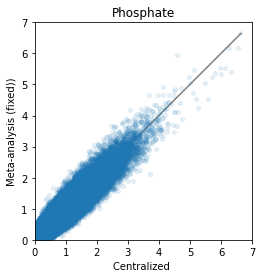

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


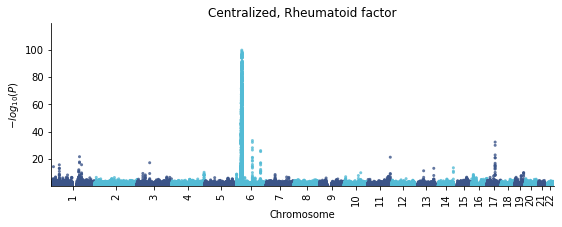

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


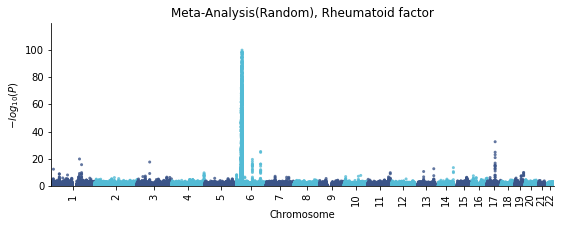

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


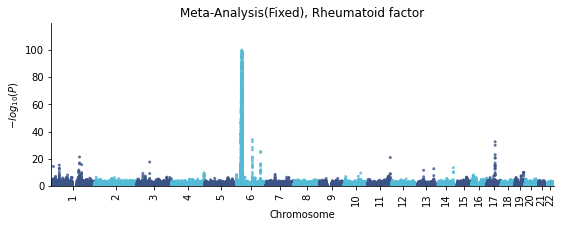

0.9676318842479454


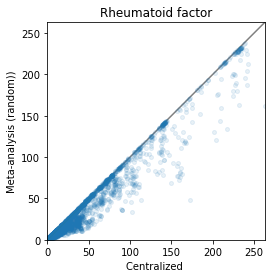

0.9996760059155272


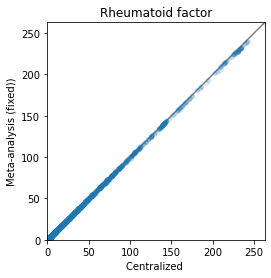

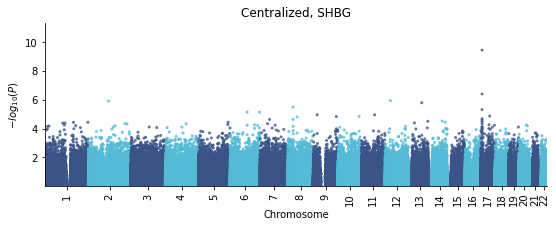

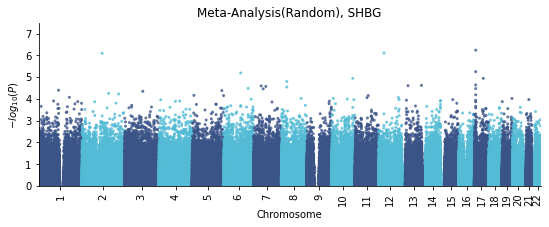

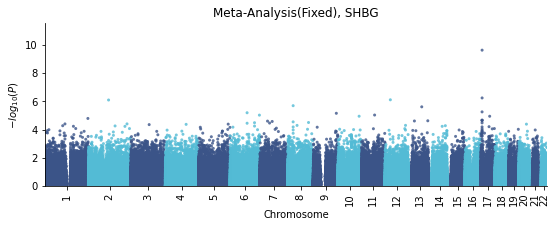

0.9004395924593847


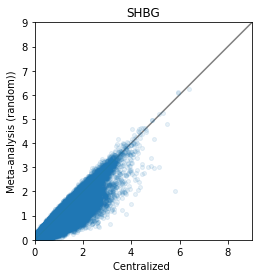

0.9610953950240207


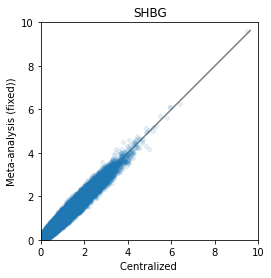

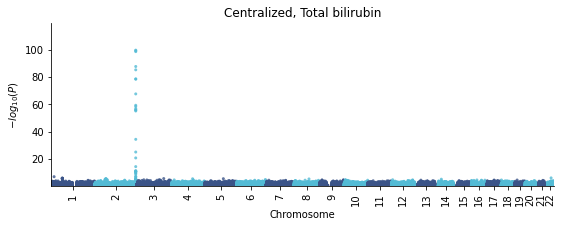

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


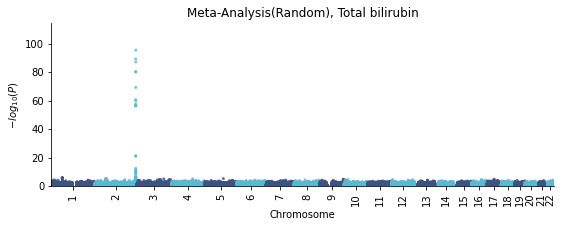

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


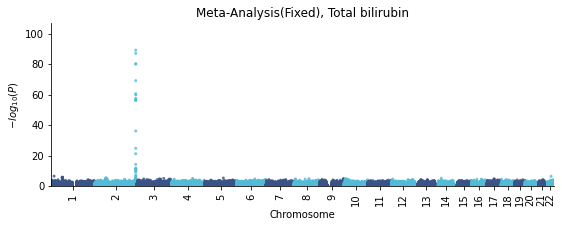

0.9307600719781852


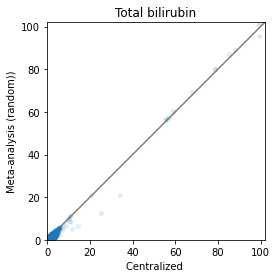

0.9718927948771321


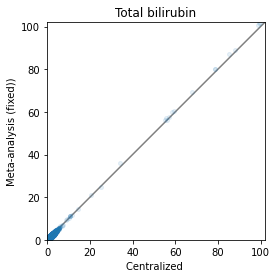

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


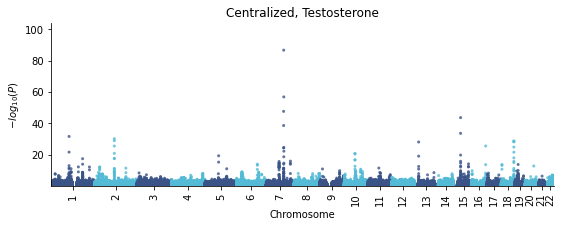

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


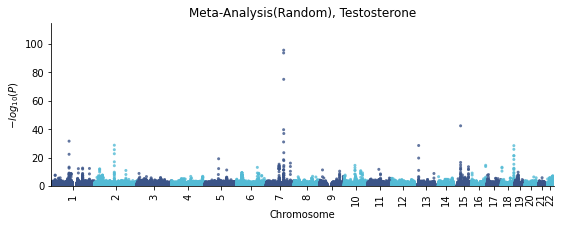

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


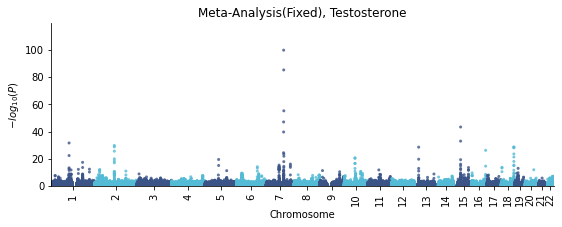

0.8936810970696176


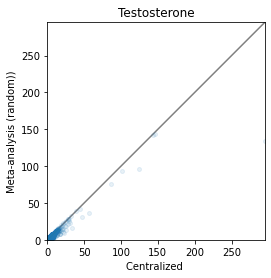

0.9899177250382485


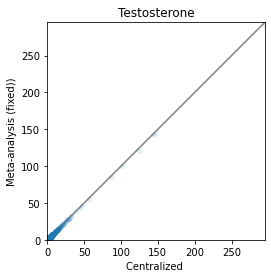

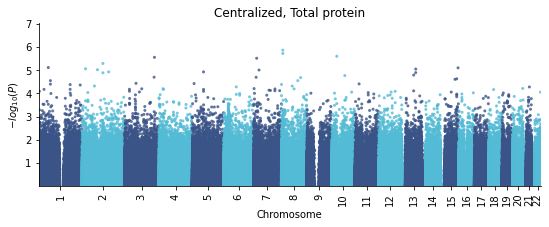

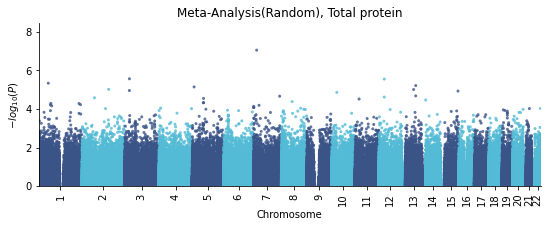

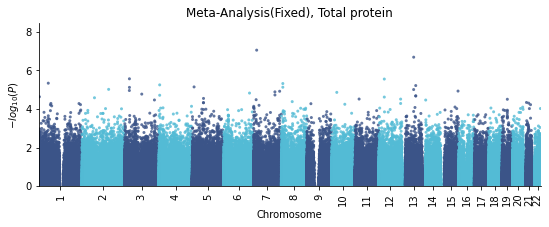

0.7749554331065619


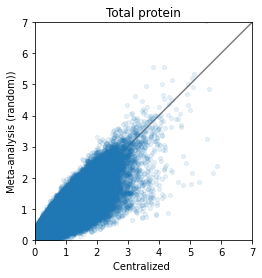

0.8114536196715976


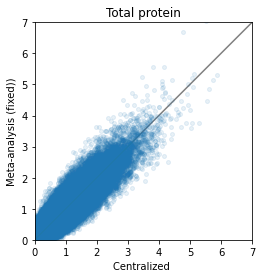

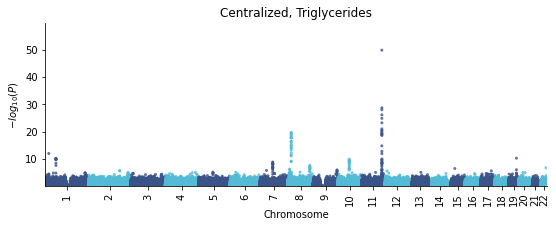

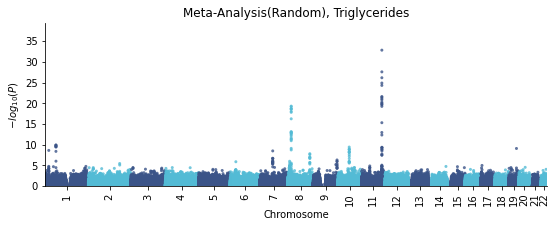

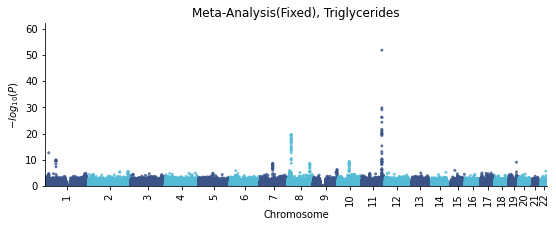

0.8581772683990037


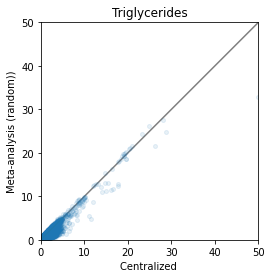

0.924115565738954


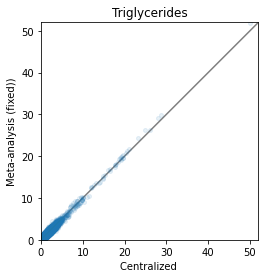

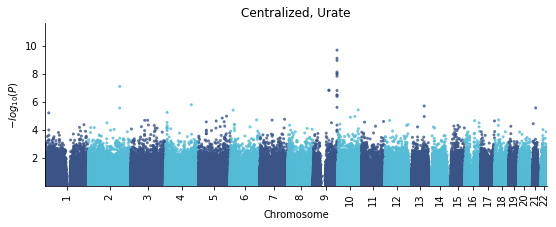

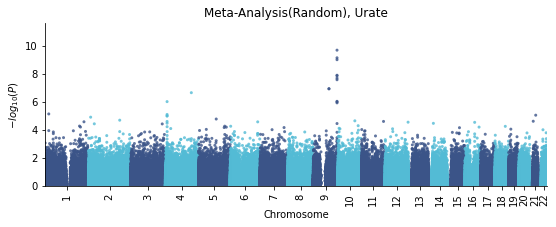

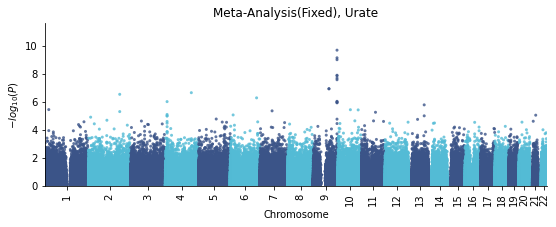

0.8609855537030717


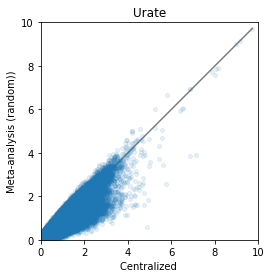

0.9078800740012167


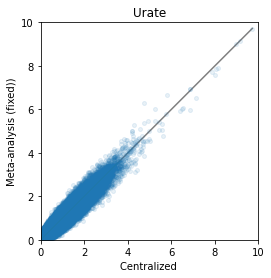

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


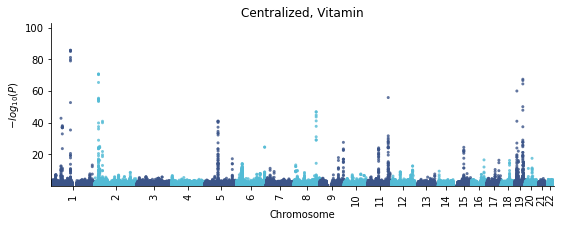

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


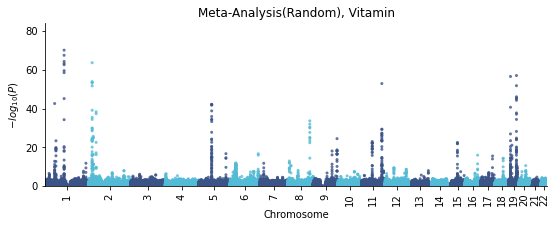

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


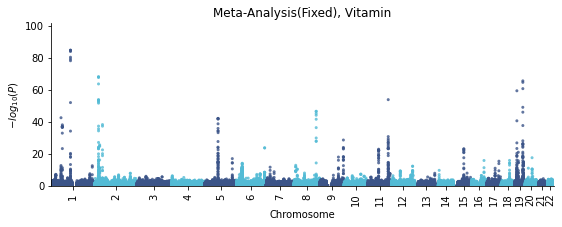

0.9009314858600013


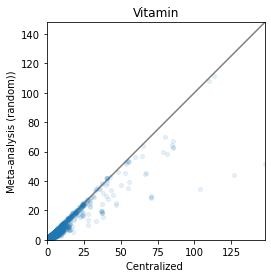

0.9876839339027118


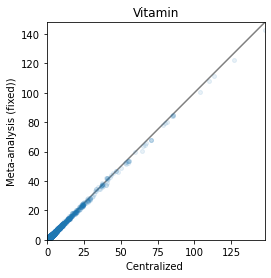

In [8]:
for phenoIndex in range(1,30):
    threshold = pow(10, -1*100)
    centralized = centralized_extended[phenoIndex]
    metaRandom = metaRandom_extended[phenoIndex]
    metaFixed = metaFixed_extended[phenoIndex]
    
    # Centralized
    manhattanplot(data=centralized[centralized['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Centralized, " + phenoCodes[phenoIndex]
        )
    plt.show()
    
     # Meta, random
    manhattanplot(data=metaRandom[metaRandom['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Meta-Analysis(Random), " + phenoCodes[phenoIndex] 
        )
    plt.show()
    
    # Meta, fixed
    manhattanplot(data=metaFixed[metaFixed['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Meta-Analysis(Fixed), " + phenoCodes[phenoIndex]
        )
    plt.show()
    
    
    # centralized vs meta(random)
    centralized['-logP'] = centralized['LOG10P']
    centralized = centralized.replace([np.inf, -np.inf], np.nan)
    centralized = centralized.dropna(how="any", axis=0)

    metaRandom['P'] = pd.to_numeric(metaRandom.loc[:, 'P'])
    metaRandom['-logP'] = metaRandom.loc[:, 'P'].apply(np.log10)
    metaRandom.loc[:, '-logP'] = metaRandom.loc[:, '-logP'].apply(lambda x: x * -1)
    metaRandom = metaRandom.replace([np.inf, -np.inf], np.nan)
    metaRandom = metaRandom.dropna(how="any", axis=0)

    cent_meta_random = pd.merge(centralized, metaRandom, how='inner', on=['#CHROM', 'POS', 'ID']) 
    print(np.corrcoef(cent_meta_random['-logP_x'].to_numpy(), cent_meta_random['-logP_y'].to_numpy())[0,1] ** 2)

    _, ax = plt.subplots()
    lims = [np.min([cent_meta_random['-logP_x'].min(), cent_meta_random['-logP_y'].min()]),  # min of both axes
            np.max([cent_meta_random['-logP_x'].max(), cent_meta_random['-logP_y'].max()]),  # max of both axes
            ]
    # plot both limits against eachother
    ax.plot(lims, lims, color="gray")
    plt.xlim(round(lims[0]), round(lims[1]))
    plt.ylim(round(lims[0]), round(lims[1]))
    ax.set_aspect('equal', adjustable='box')

    plt.xlabel("Centralized ")
    plt.ylabel("Meta-analysis (random)")
    plt.title(phenoCodes[phenoIndex])
    # plot markers
    plt.plot(cent_meta_random['-logP_x'], cent_meta_random['-logP_y'], 'o', alpha=0.1, markersize=4)
    plt.show()
    
    # centralized vs meta(fixed)
    metaFixed['P'] = pd.to_numeric(metaFixed.loc[:, 'P'])
    metaFixed['-logP'] = metaFixed.loc[:, 'P'].apply(np.log10)
    metaFixed.loc[:, '-logP'] = metaFixed.loc[:, '-logP'].apply(lambda x: x * -1)
    metaFixed = metaFixed.replace([np.inf, -np.inf], np.nan)
    metaFixed = metaFixed.dropna(how="any", axis=0)

    cent_meta_fixed = pd.merge(centralized, metaFixed, how='inner', on=['#CHROM', 'POS', 'ID']) 
    print(np.corrcoef(cent_meta_fixed['-logP_x'].to_numpy(), cent_meta_fixed['-logP_y'].to_numpy())[0,1] ** 2)

    _, ax = plt.subplots()
    lims = [np.min([cent_meta_fixed['-logP_x'].min(), cent_meta_fixed['-logP_y'].min()]),  # min of both axes
            np.max([cent_meta_fixed['-logP_x'].max(), cent_meta_fixed['-logP_y'].max()]),  # max of both axes
            ]


    # plot both limits against eachother
    ax.plot(lims, lims, color="gray")
    plt.xlim(round(lims[0]), round(lims[1]))
    plt.ylim(round(lims[0]), round(lims[1]))
    ax.set_aspect('equal', adjustable='box')

    plt.xlabel("Centralized ")
    plt.ylabel("Meta-analysis (fixed)")
    plt.title(phenoCodes[phenoIndex])

    # plot markers
    plt.plot(cent_meta_fixed['-logP_x'], cent_meta_fixed['-logP_y'], 'o', alpha=0.1, markersize=4)


    plt.show()

In [11]:
# Extended analysis, round 2 
pathToExtendedMetaAnalysis = "regenie_analysis/ukb_extended_assoc_round2/"
pathToExtendedCentralizedAnalysis = "../jeffchen/regenie_analysis/"
centralized_extended = {}
metaRandom_extended = {}
metaFixed_extended = {}

for phenoIndex in range(1,32):
    # Read in centralized results
    centralizedFile = pathToExtendedCentralizedAnalysis + "ukb_block_8192_fold_extended_assoc_Y" + str(phenoIndex) + ".regenie"
    centralized_extended[phenoIndex] = pd.read_table(centralizedFile, 
                                     delim_whitespace=True,
                                     usecols=['CHROM','GENPOS', 'ID', 'LOG10P'] # log10P is -log(P)
                                    )
    centralized_extended[phenoIndex].rename(columns={'CHROM': '#CHROM', 'GENPOS':'POS'}, inplace=True)
    centralized_extended[phenoIndex]['P'] = -1 * centralized_extended[phenoIndex]['LOG10P']
    centralized_extended[phenoIndex]['P'] = 10 ** centralized_extended[phenoIndex]['P']
    centralized_extended[phenoIndex] = centralized_extended[phenoIndex].dropna(how="any", axis=0, subset=['P'])  # clean data
    centralized_extended[phenoIndex][['#CHROM']] = centralized_extended[phenoIndex][['#CHROM']].astype(str)

    # Read in meta-analysis results
    metaFile = pathToExtendedMetaAnalysis + "ukb_extended_assoc_Y" + str(phenoIndex) + ".meta"
    metaRandom_extended[phenoIndex] = pd.read_table(metaFile, 
                                     delim_whitespace=True,
                                     usecols=['CHR', 'BP', 'SNP', 'P(R)']
                                    )
    metaRandom_extended[phenoIndex] = metaRandom_extended[phenoIndex].dropna(how="any", axis=0, subset=['P(R)']) # clean data
    metaRandom_extended[phenoIndex].rename(columns={'CHR': '#CHROM', 'BP':'POS', 'SNP':'ID', 'P(R)':'P'}, inplace=True)
    metaRandom_extended[phenoIndex][['#CHROM']] = metaRandom_extended[phenoIndex][['#CHROM']].astype(str)

    # Read in meta-analysis results
    metaFixed_extended[phenoIndex] = pd.read_table(metaFile, 
                                     delim_whitespace=True,
                                     usecols=['CHR', 'BP', 'SNP', 'P']
                                    )
    metaFixed_extended[phenoIndex] = metaFixed_extended[phenoIndex].dropna(how="any", axis=0, subset=['P'])  # clean data
    metaFixed_extended[phenoIndex].rename(columns={'CHR': '#CHROM', 'BP':'POS', 'SNP':'ID',}, inplace=True)
    metaFixed_extended[phenoIndex][['#CHROM']] = metaFixed_extended[phenoIndex][['#CHROM']].astype(str)

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


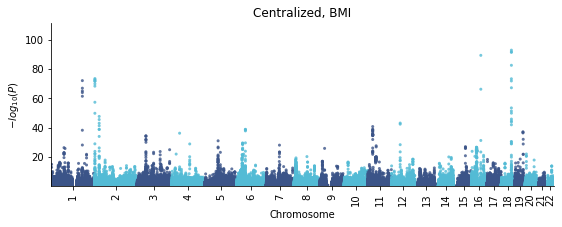

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


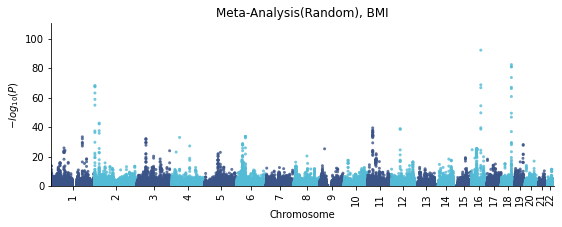

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


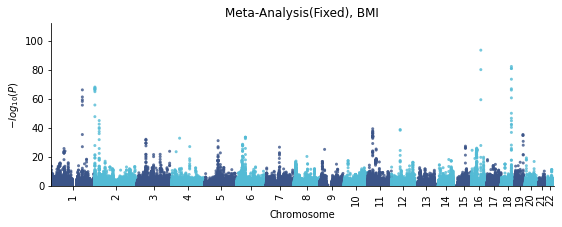

0.8536931615901417


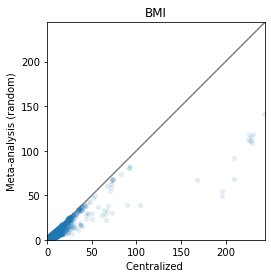

0.9794939252092549


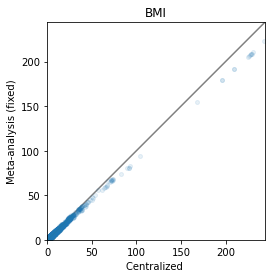

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


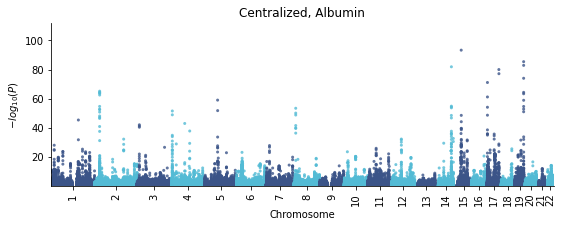

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


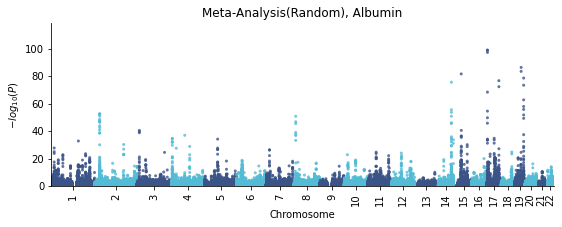

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


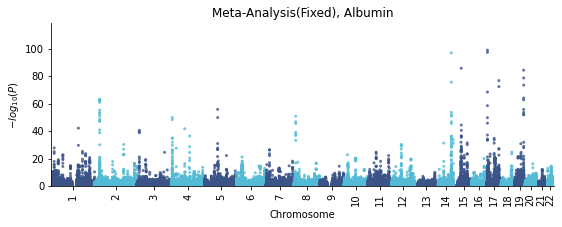

0.9416234637435529


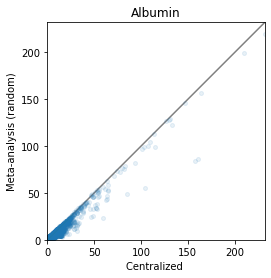

0.9856998969289681


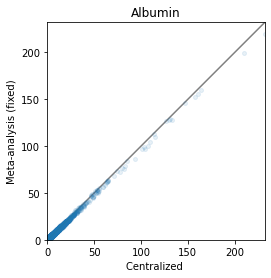

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


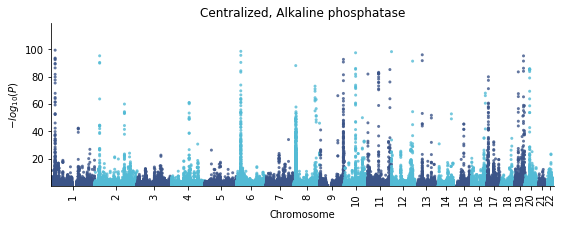

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


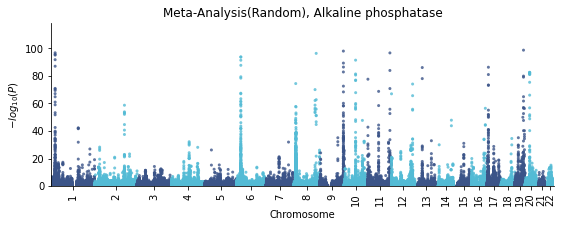

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


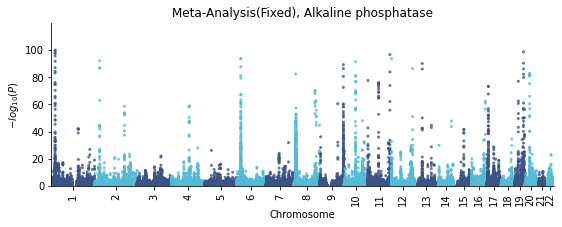

0.8916382998406082


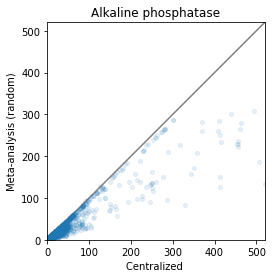

0.9950704872403423


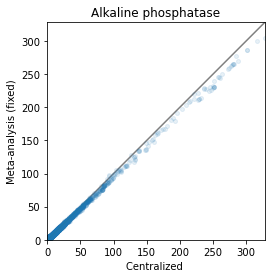

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


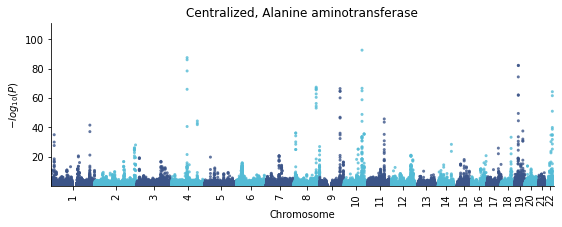

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


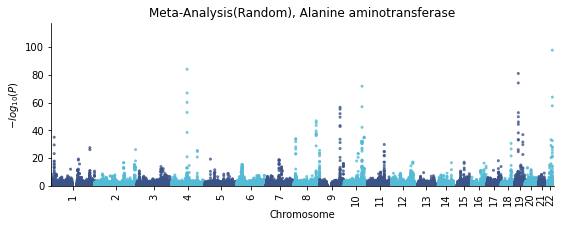

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


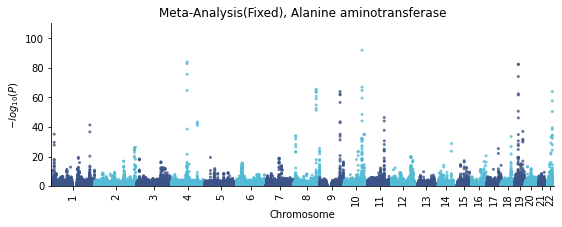

0.8263279860144256


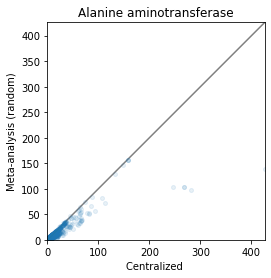

0.9907017619171278


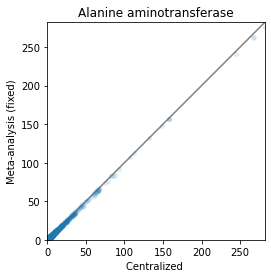

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


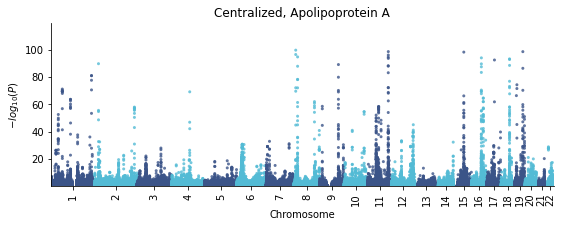

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


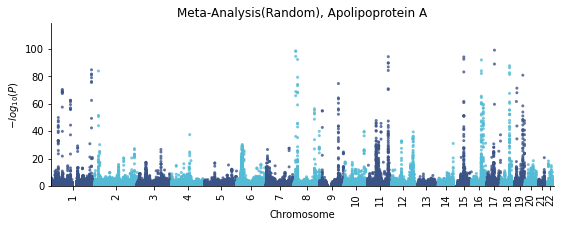

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


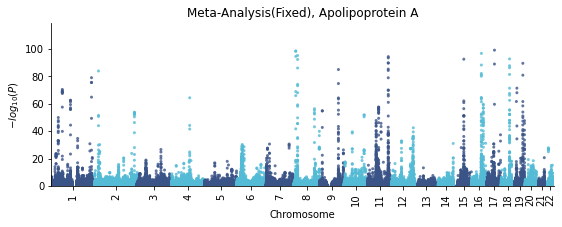

0.8742530682794479


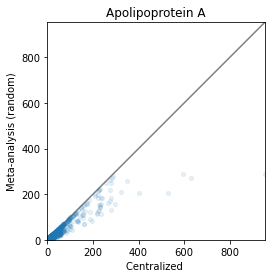

0.9935614278529146


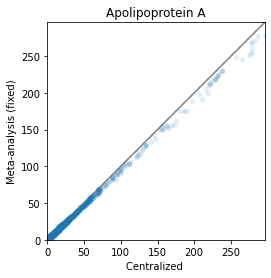

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


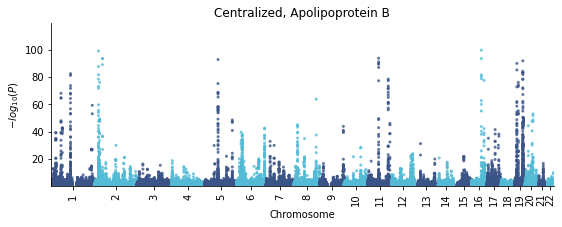

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


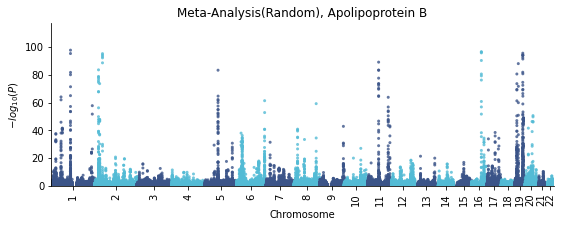

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


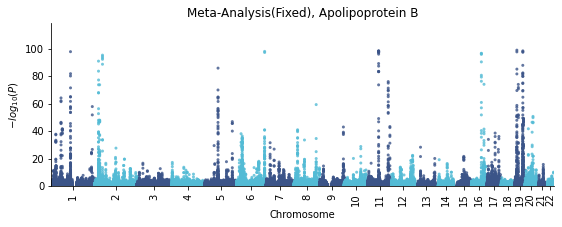

0.834574984218161


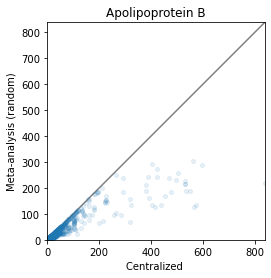

0.9948404403334257


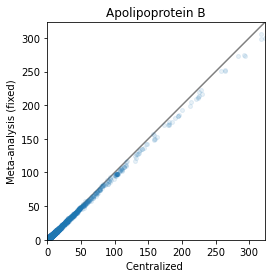

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


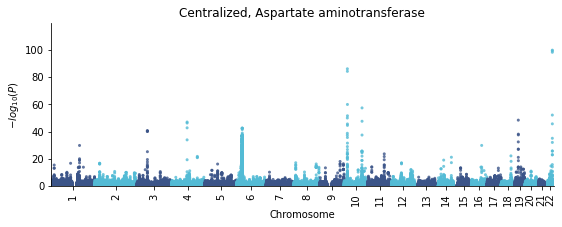

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


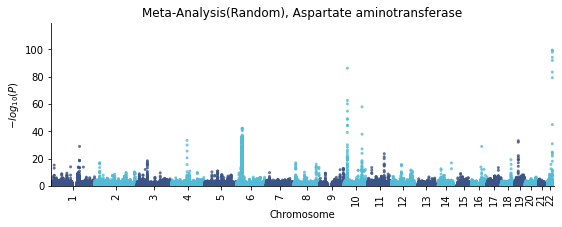

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


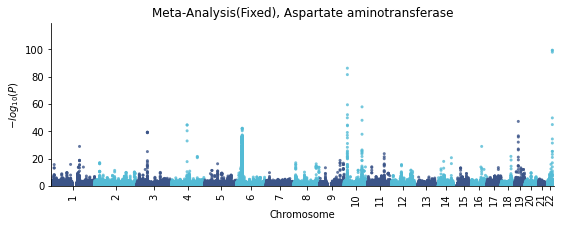

0.9185080309000587


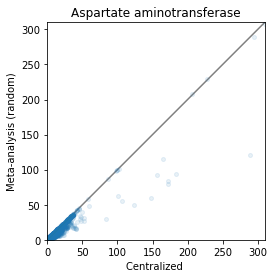

0.993037795126275


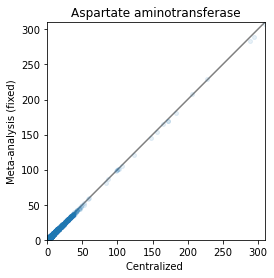

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


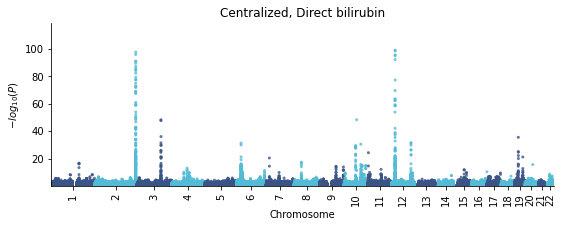

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


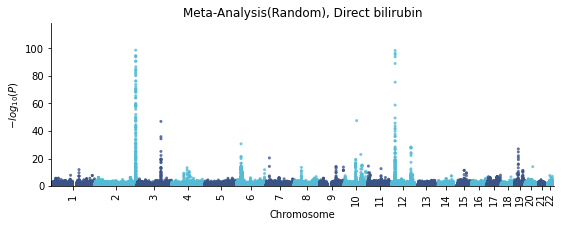

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


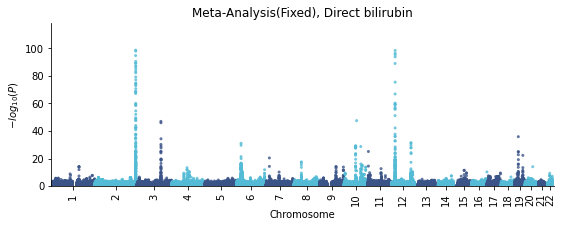

0.6762696792446822


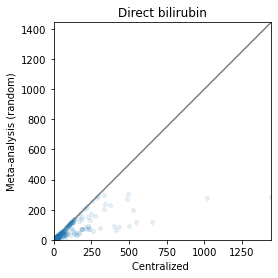

0.9960881177818982


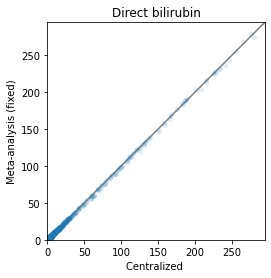

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


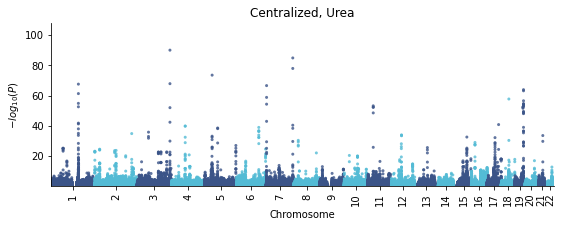

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


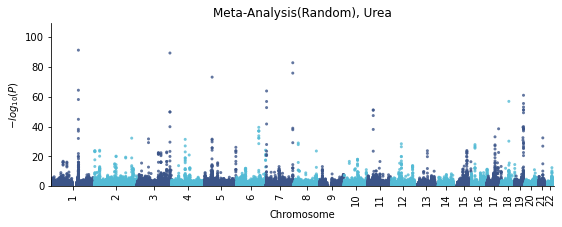

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


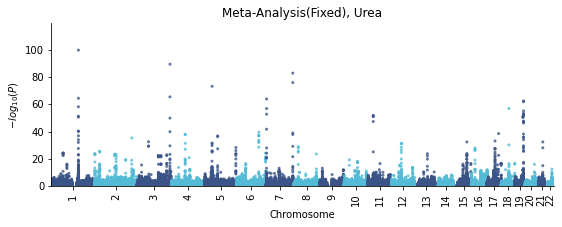

0.9324834660508295


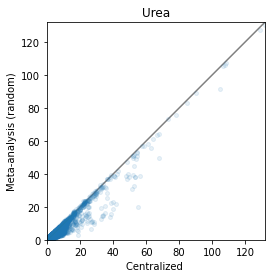

0.9833583724421247


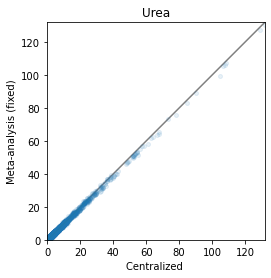

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


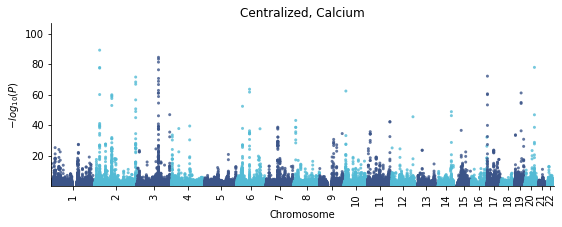

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


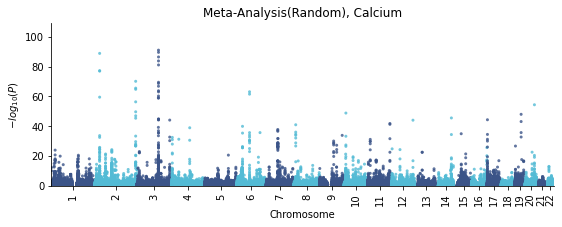

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


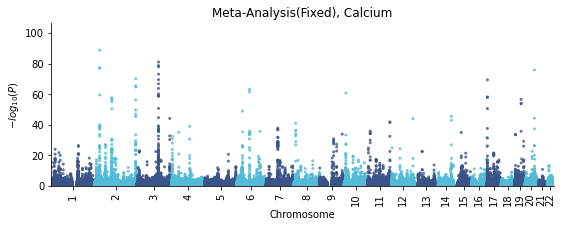

0.8673434303168749


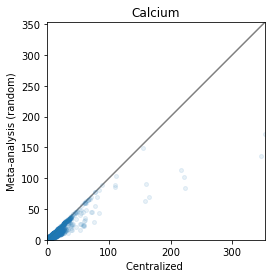

0.9874025511568436


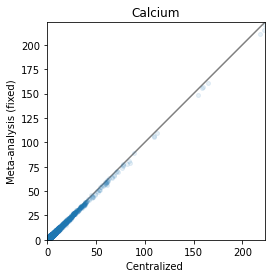

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


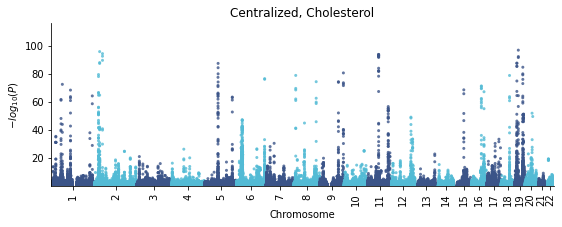

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


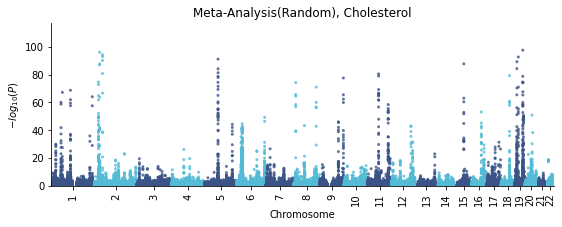

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


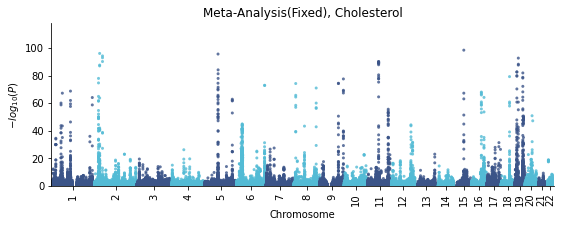

0.8799385039067843


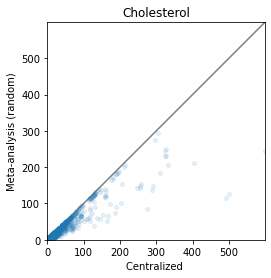

0.9954590687605392


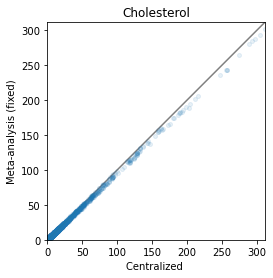

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


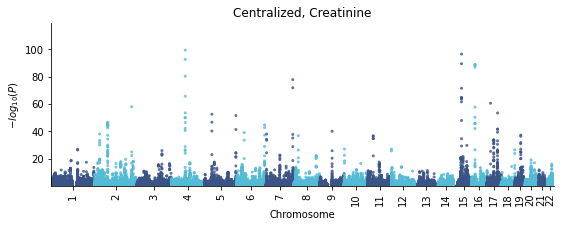

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


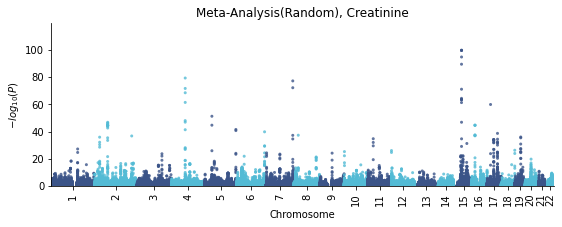

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


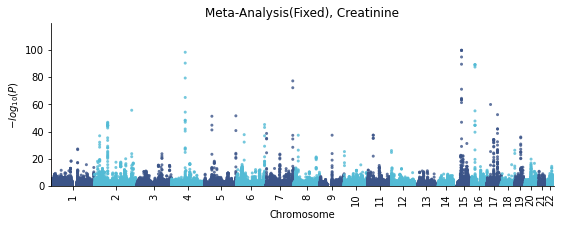

0.9163097353452045


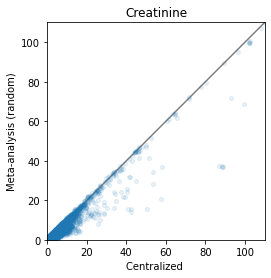

0.9781224889953481


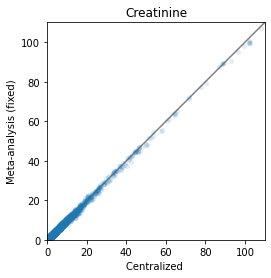

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


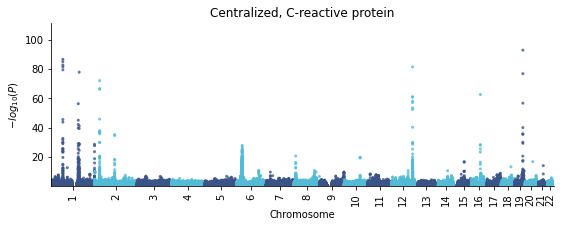

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


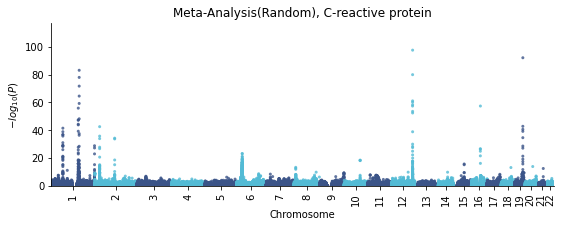

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


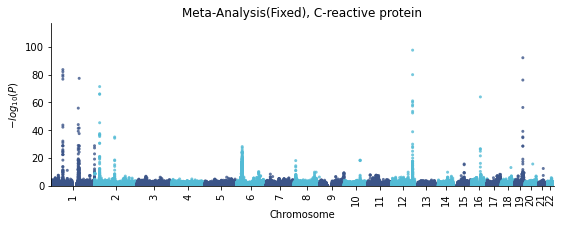

0.9308089713919616


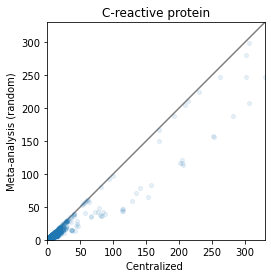

0.9956061987791232


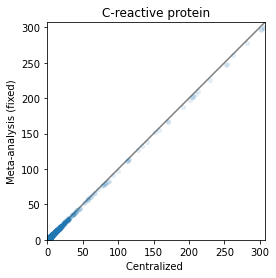

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


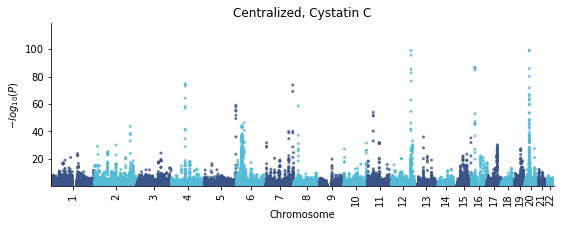

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


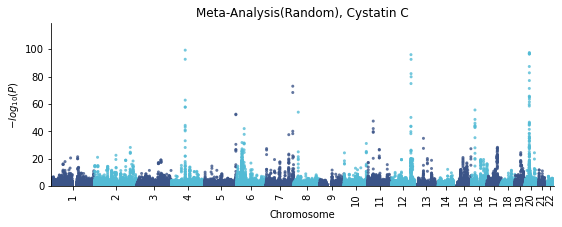

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


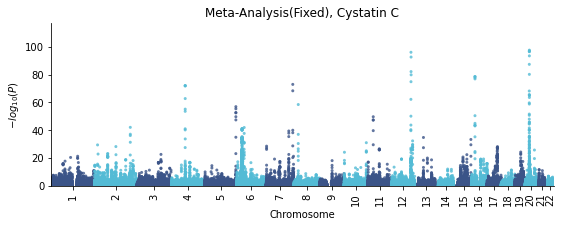

0.8827470494023149


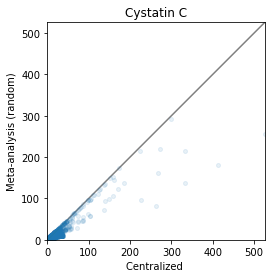

0.9899295685889792


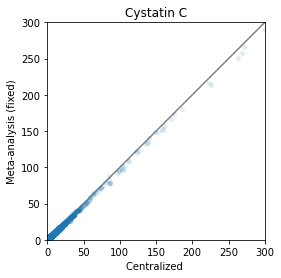

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


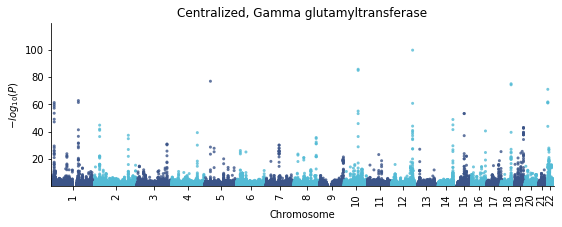

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


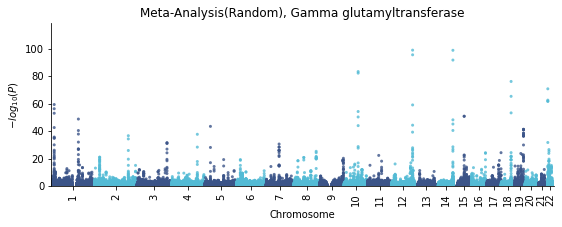

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


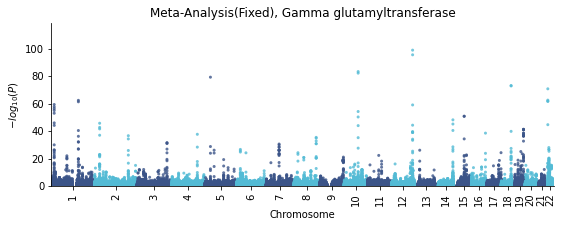

0.9201470177551936


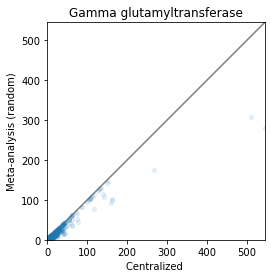

0.9875829607775741


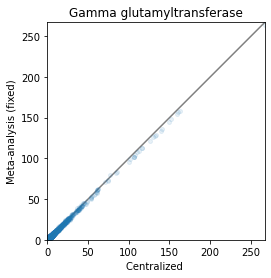

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


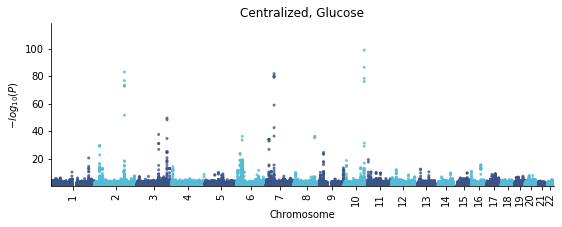

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


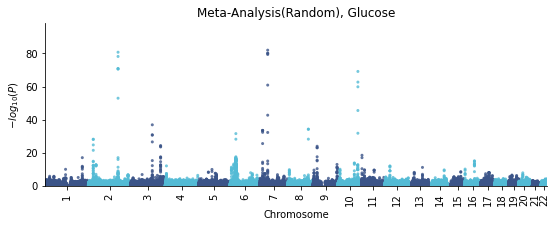

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


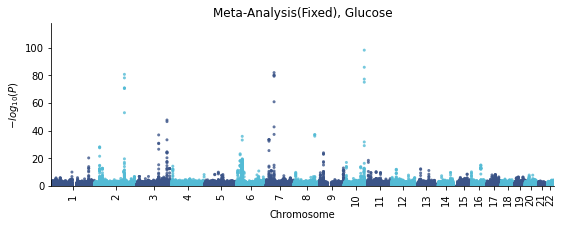

0.9256134801543516


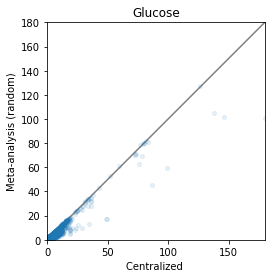

0.9886919672147677


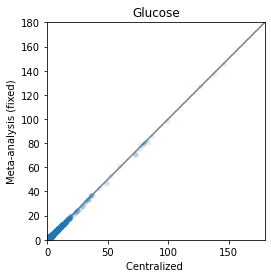

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


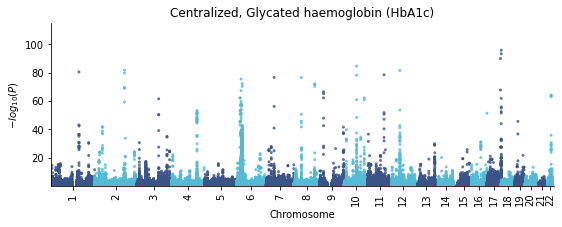

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


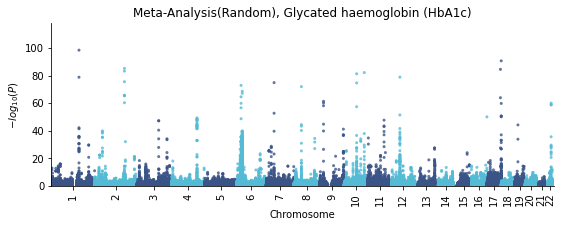

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


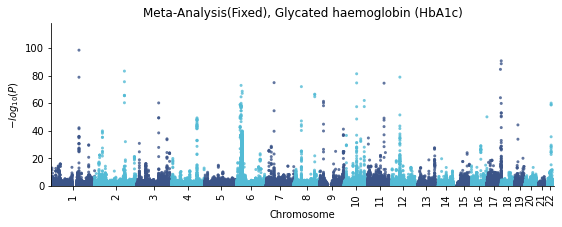

0.8970986443297694


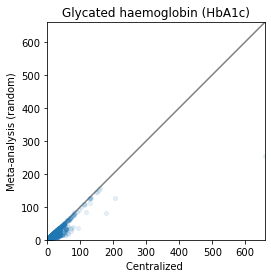

0.9915988370747214


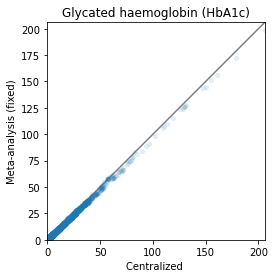

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


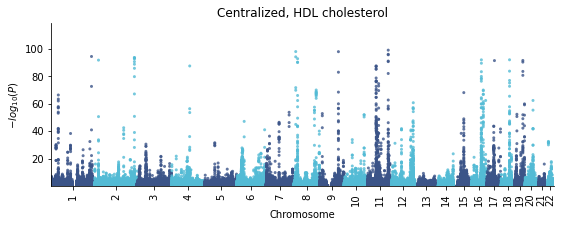

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


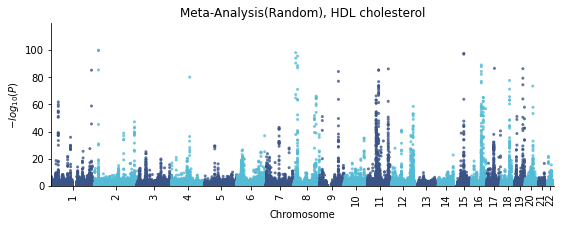

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


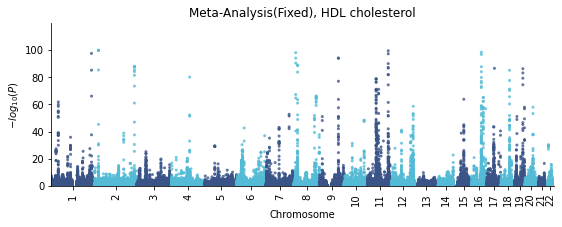

0.9116283690501059


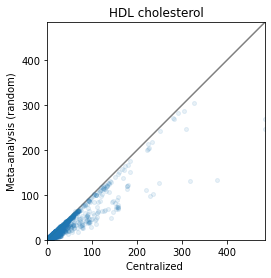

0.9922700740274352


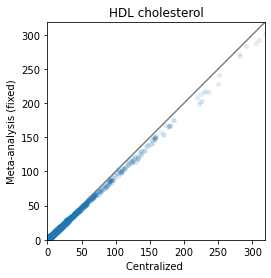

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


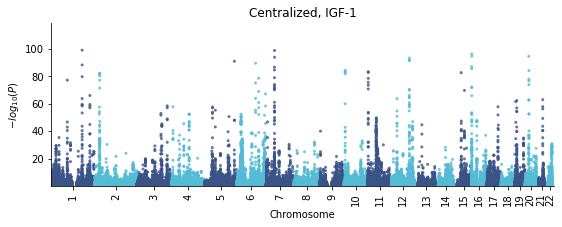

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


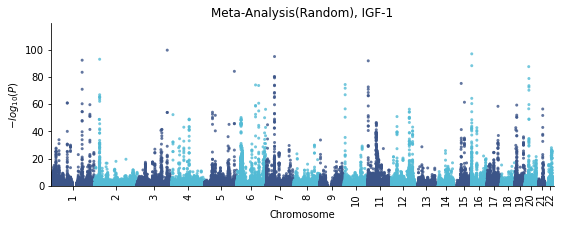

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


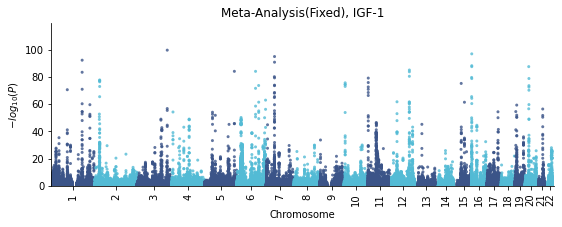

0.928900705518513


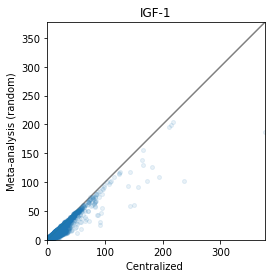

0.9880530256752996


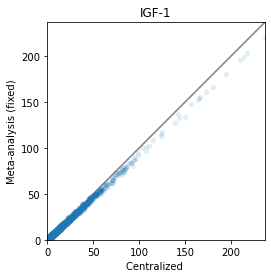

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


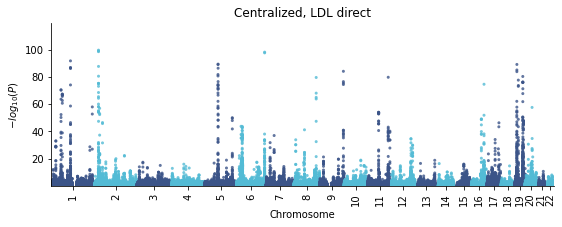

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


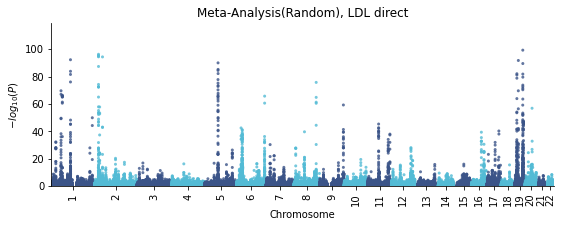

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


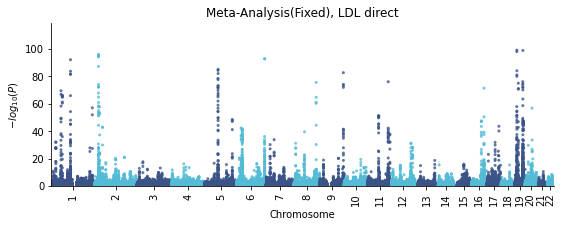

0.8438017427048159


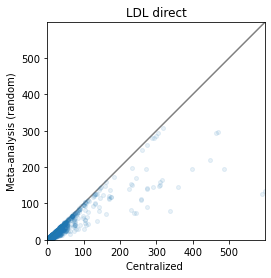

0.9959119413195113


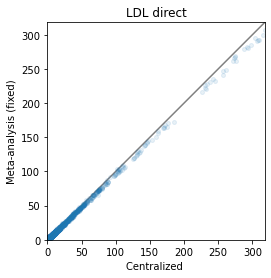

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


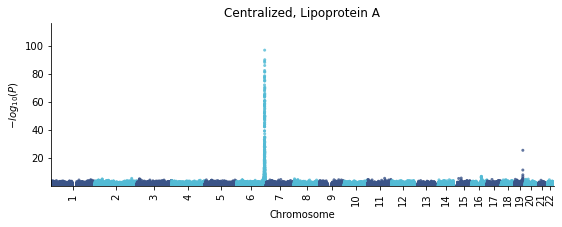

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


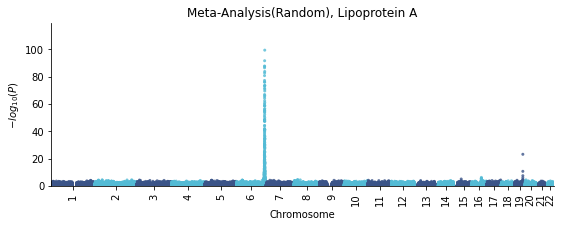

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


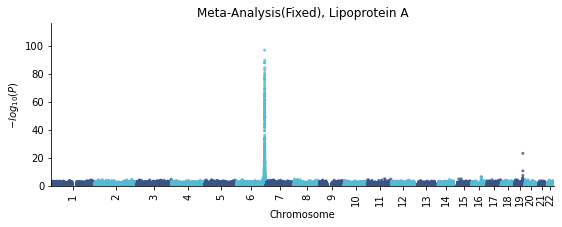

0.7313214286617962


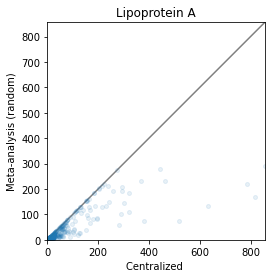

0.9934452953871463


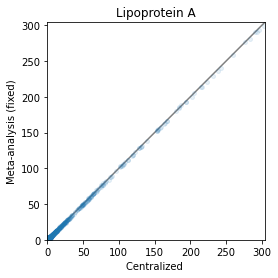

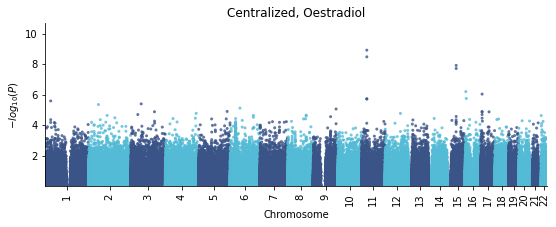

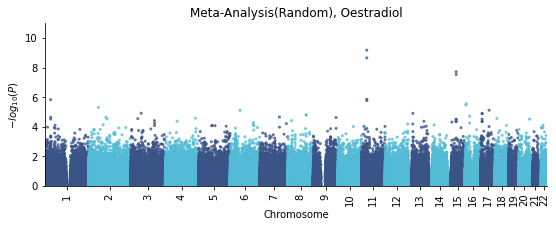

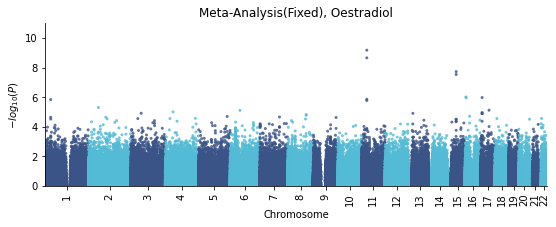

0.8777597630142949


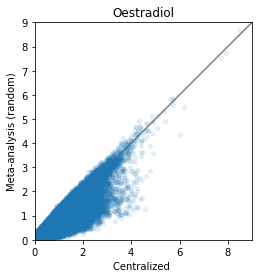

0.9549900116193393


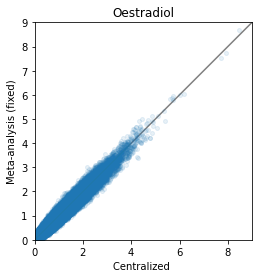

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


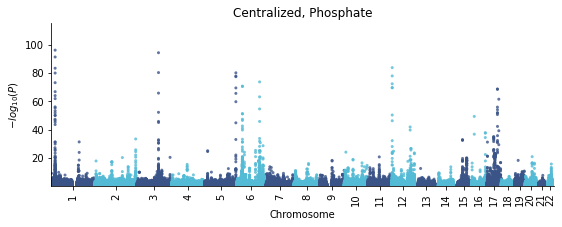

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


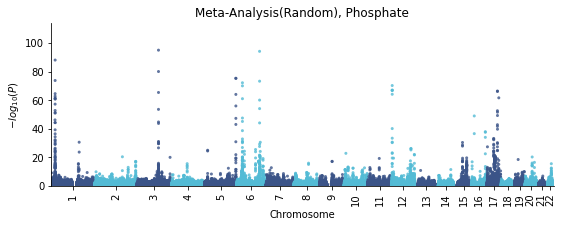

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


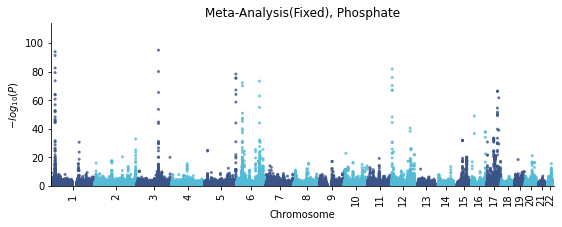

0.8553643209617018


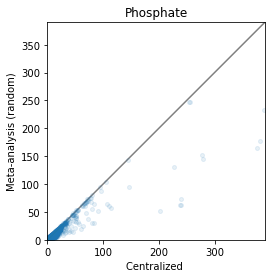

0.9892888014755024


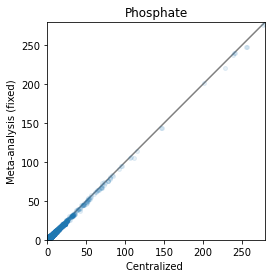

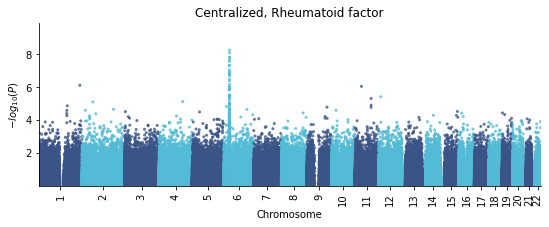

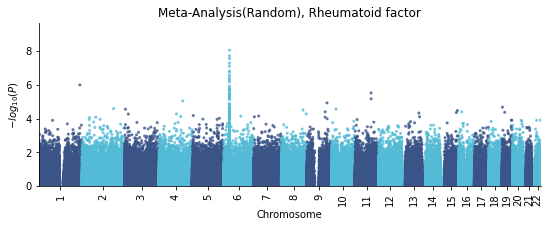

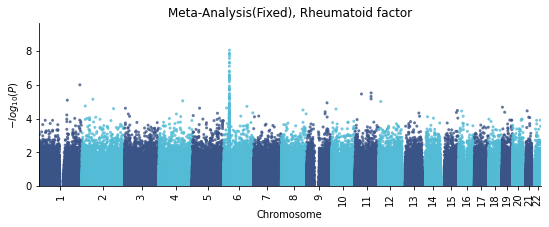

0.9100063349554087


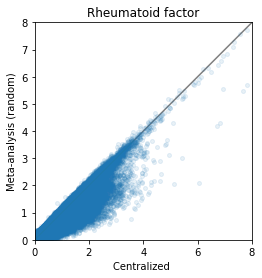

0.983299496189897


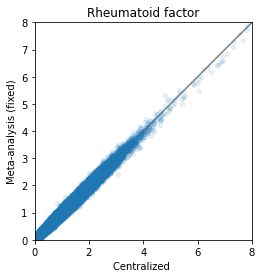

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


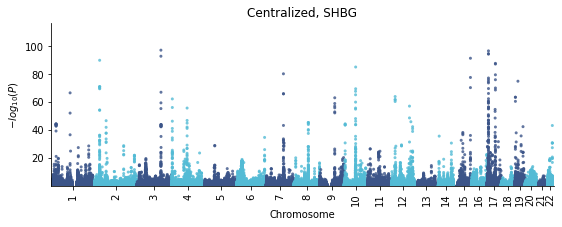

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


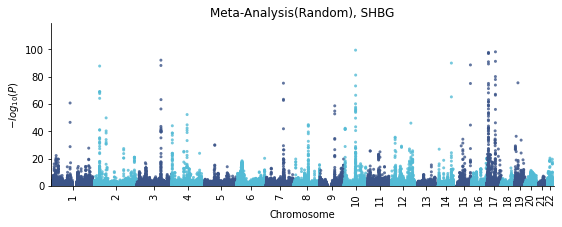

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


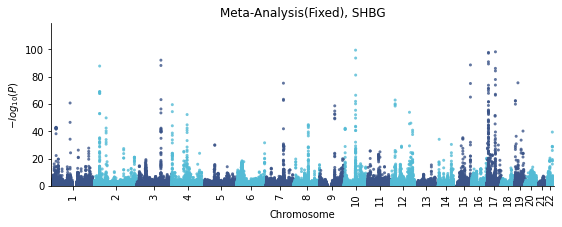

0.814969790299538


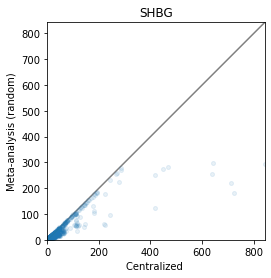

0.9930836230437603


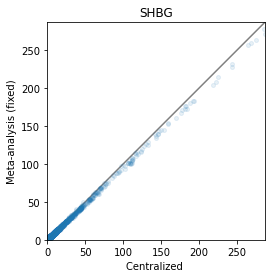

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


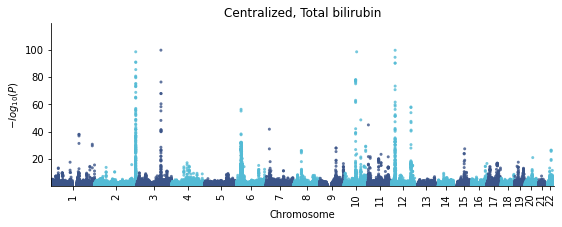

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


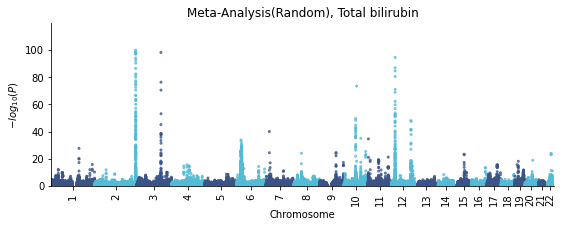

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


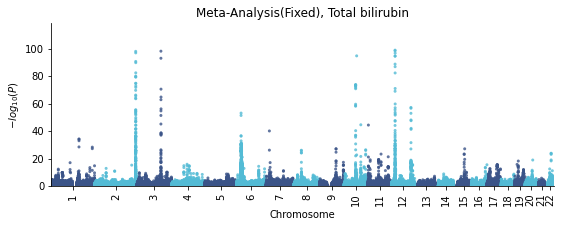

0.6178464963771421


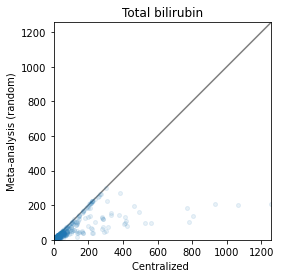

0.9963463423029535


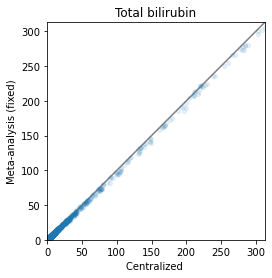

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


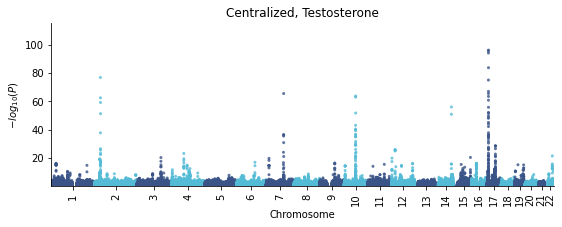

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


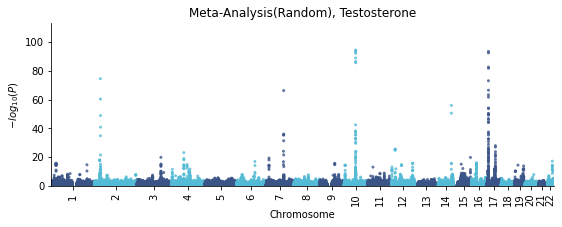

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


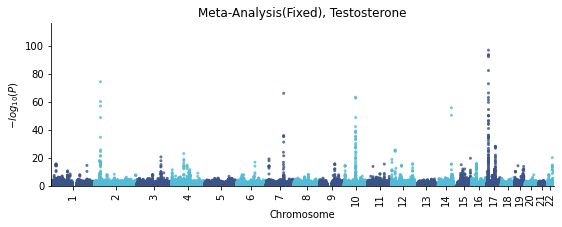

0.9557605719658889


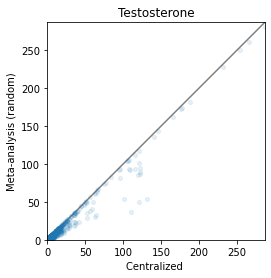

0.9943414839258456


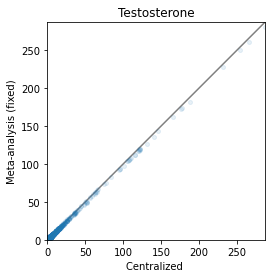

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


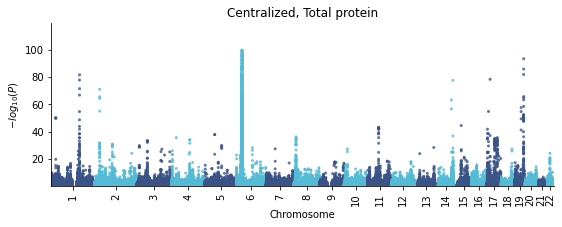

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


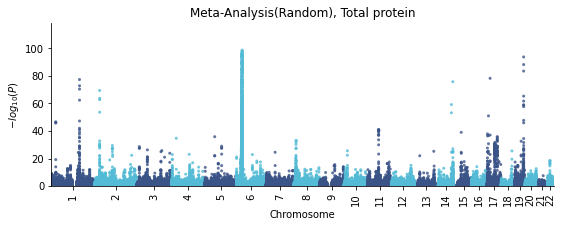

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


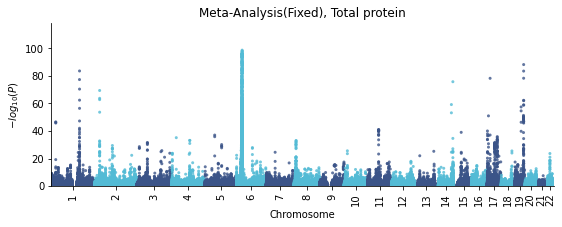

0.9614567442764599


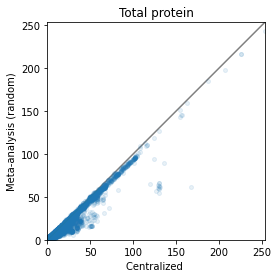

0.9950694283911675


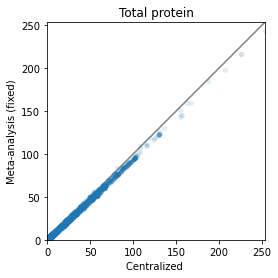

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


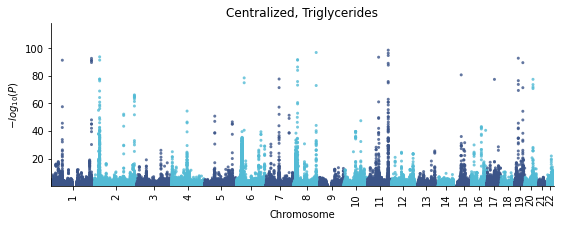

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


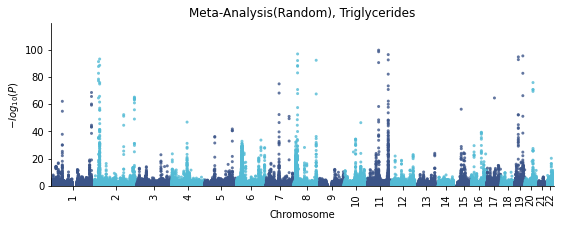

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


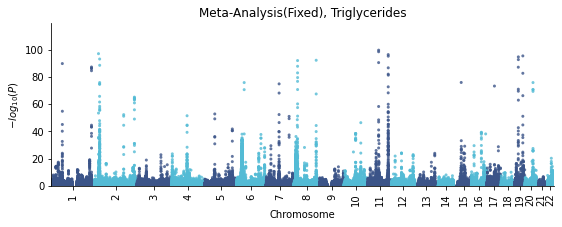

0.8139428071552367


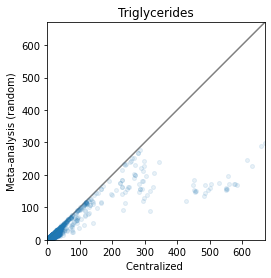

0.9960941918206606


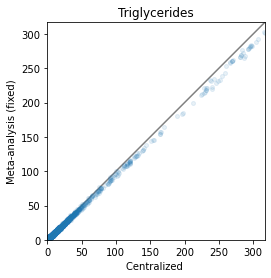

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


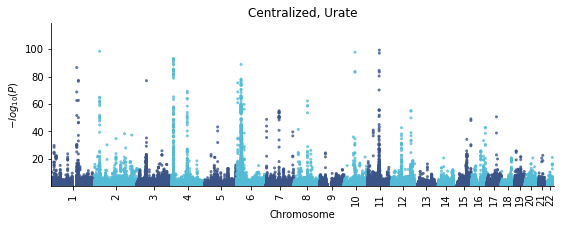

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


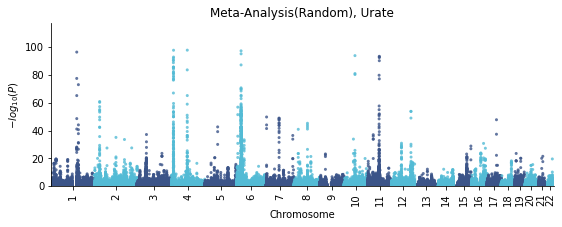

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


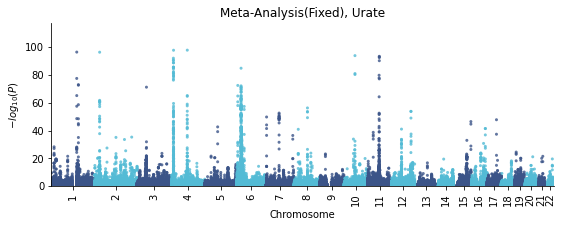

0.9361693771167385


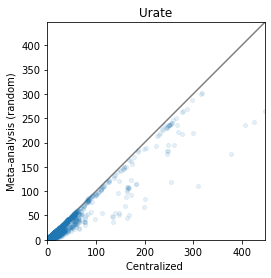

0.995882046579885


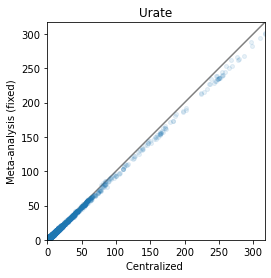

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


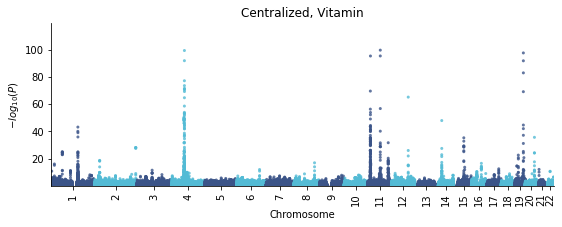

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


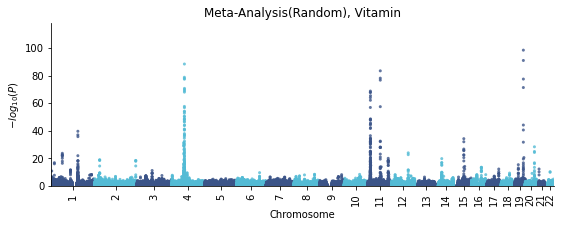

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


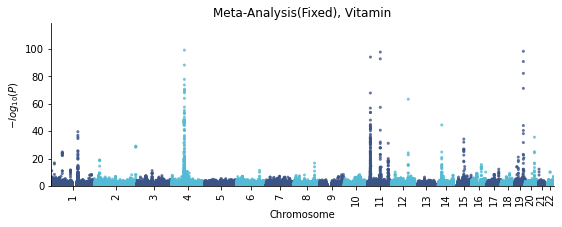

0.6348934607819728


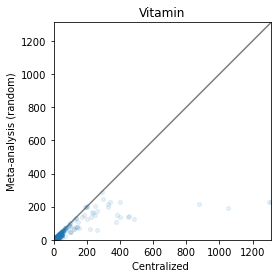

0.9907621649326781


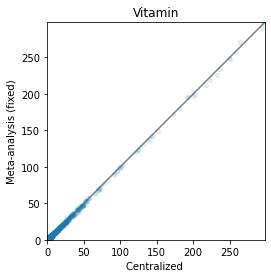

In [12]:
for phenoIndex in range(1,32):
    threshold = pow(10, -1*100)
    centralized = centralized_extended[phenoIndex]
    metaRandom = metaRandom_extended[phenoIndex]
    metaFixed = metaFixed_extended[phenoIndex]
    
    # Centralized
    manhattanplot(data=centralized[centralized['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Centralized, " + phenoCodes[phenoIndex]
        )
    plt.show()
    
     # Meta, random
    manhattanplot(data=metaRandom[metaRandom['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Meta-Analysis(Random), " + phenoCodes[phenoIndex] 
        )
    plt.show()
    
    # Meta, fixed
    manhattanplot(data=metaFixed[metaFixed['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Meta-Analysis(Fixed), " + phenoCodes[phenoIndex]
        )
    plt.show()
    
    
    # centralized vs meta(random)
    centralized['-logP'] = centralized['LOG10P']
    centralized = centralized.replace([np.inf, -np.inf], np.nan)
    centralized = centralized.dropna(how="any", axis=0)

    metaRandom['P'] = pd.to_numeric(metaRandom.loc[:, 'P'])
    metaRandom['-logP'] = metaRandom.loc[:, 'P'].apply(np.log10)
    metaRandom.loc[:, '-logP'] = metaRandom.loc[:, '-logP'].apply(lambda x: x * -1)
    metaRandom = metaRandom.replace([np.inf, -np.inf], np.nan)
    metaRandom = metaRandom.dropna(how="any", axis=0)

    cent_meta_random = pd.merge(centralized, metaRandom, how='inner', on=['#CHROM', 'POS', 'ID']) 
    print(np.corrcoef(cent_meta_random['-logP_x'].to_numpy(), cent_meta_random['-logP_y'].to_numpy())[0,1] ** 2)

    _, ax = plt.subplots()
    lims = [np.min([cent_meta_random['-logP_x'].min(), cent_meta_random['-logP_y'].min()]),  # min of both axes
            np.max([cent_meta_random['-logP_x'].max(), cent_meta_random['-logP_y'].max()]),  # max of both axes
            ]
    # plot both limits against eachother
    ax.plot(lims, lims, color="gray")
    plt.xlim(round(lims[0]), round(lims[1]))
    plt.ylim(round(lims[0]), round(lims[1]))
    ax.set_aspect('equal', adjustable='box')

    plt.xlabel("Centralized ")
    plt.ylabel("Meta-analysis (random)")
    plt.title(phenoCodes[phenoIndex])
    # plot markers
    plt.plot(cent_meta_random['-logP_x'], cent_meta_random['-logP_y'], 'o', alpha=0.1, markersize=4)
    plt.show()
    
    # centralized vs meta(fixed)
    metaFixed['P'] = pd.to_numeric(metaFixed.loc[:, 'P'])
    metaFixed['-logP'] = metaFixed.loc[:, 'P'].apply(np.log10)
    metaFixed.loc[:, '-logP'] = metaFixed.loc[:, '-logP'].apply(lambda x: x * -1)
    metaFixed = metaFixed.replace([np.inf, -np.inf], np.nan)
    metaFixed = metaFixed.dropna(how="any", axis=0)

    cent_meta_fixed = pd.merge(centralized, metaFixed, how='inner', on=['#CHROM', 'POS', 'ID']) 
    print(np.corrcoef(cent_meta_fixed['-logP_x'].to_numpy(), cent_meta_fixed['-logP_y'].to_numpy())[0,1] ** 2)

    _, ax = plt.subplots()
    lims = [np.min([cent_meta_fixed['-logP_x'].min(), cent_meta_fixed['-logP_y'].min()]),  # min of both axes
            np.max([cent_meta_fixed['-logP_x'].max(), cent_meta_fixed['-logP_y'].max()]),  # max of both axes
            ]


    # plot both limits against eachother
    ax.plot(lims, lims, color="gray")
    plt.xlim(round(lims[0]), round(lims[1]))
    plt.ylim(round(lims[0]), round(lims[1]))
    ax.set_aspect('equal', adjustable='box')

    plt.xlabel("Centralized ")
    plt.ylabel("Meta-analysis (fixed)")
    plt.title(phenoCodes[phenoIndex])

    # plot markers
    plt.plot(cent_meta_fixed['-logP_x'], cent_meta_fixed['-logP_y'], 'o', alpha=0.1, markersize=4)


    plt.show()

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


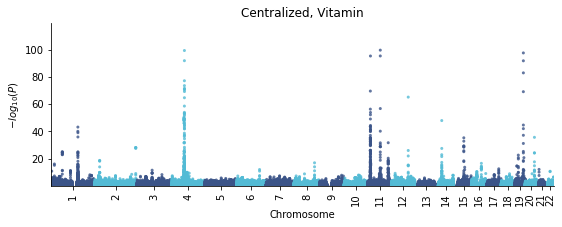

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


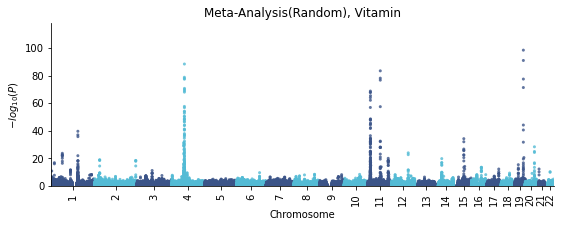

/home/medupall/miniconda3/lib/python3.9/site-packages/qmplot/modules/_manhattan.py:239: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[[chrom]] = data[[chrom]].astype(str)  # make sure all the chromosome id are character.


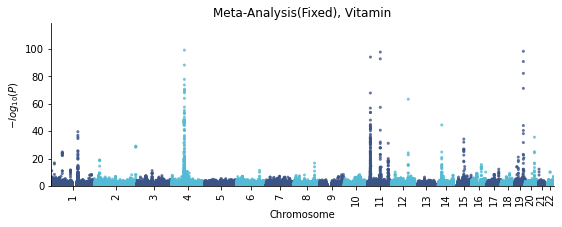

0.6348934607819728


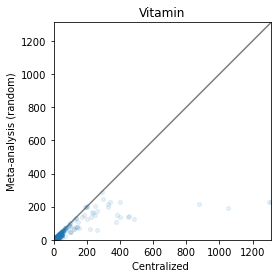

0.9907621649326781


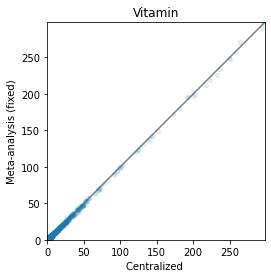

In [10]:
for phenoIndex in range(31,32):
    threshold = pow(10, -1*100)
    centralized = centralized_extended[phenoIndex]
    metaRandom = metaRandom_extended[phenoIndex]
    metaFixed = metaFixed_extended[phenoIndex]
    
    # Centralized
    manhattanplot(data=centralized[centralized['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Centralized, " + phenoCodes[phenoIndex]
        )
    plt.show()
    
     # Meta, random
    manhattanplot(data=metaRandom[metaRandom['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Meta-Analysis(Random), " + phenoCodes[phenoIndex] 
        )
    plt.show()
    
    # Meta, fixed
    manhattanplot(data=metaFixed[metaFixed['P'] >= threshold],
        suggestiveline=None, # Turn off suggestive line
        genomewideline=None, # Turn off suggestive line
        marker = '.',
        xticklabel_kws={"rotation": "vertical"},  # set vertical or any other degrees as you like.
        title="Meta-Analysis(Fixed), " + phenoCodes[phenoIndex]
        )
    plt.show()
    
    
    # centralized vs meta(random)
    centralized['-logP'] = centralized['LOG10P']
    centralized = centralized.replace([np.inf, -np.inf], np.nan)
    centralized = centralized.dropna(how="any", axis=0)

    metaRandom['P'] = pd.to_numeric(metaRandom.loc[:, 'P'])
    metaRandom['-logP'] = metaRandom.loc[:, 'P'].apply(np.log10)
    metaRandom.loc[:, '-logP'] = metaRandom.loc[:, '-logP'].apply(lambda x: x * -1)
    metaRandom = metaRandom.replace([np.inf, -np.inf], np.nan)
    metaRandom = metaRandom.dropna(how="any", axis=0)

    cent_meta_random = pd.merge(centralized, metaRandom, how='inner', on=['#CHROM', 'POS', 'ID']) 
    print(np.corrcoef(cent_meta_random['-logP_x'].to_numpy(), cent_meta_random['-logP_y'].to_numpy())[0,1] ** 2)

    _, ax = plt.subplots()
    lims = [np.min([cent_meta_random['-logP_x'].min(), cent_meta_random['-logP_y'].min()]),  # min of both axes
            np.max([cent_meta_random['-logP_x'].max(), cent_meta_random['-logP_y'].max()]),  # max of both axes
            ]
    # plot both limits against eachother
    ax.plot(lims, lims, color="gray")
    plt.xlim(round(lims[0]), round(lims[1]))
    plt.ylim(round(lims[0]), round(lims[1]))
    ax.set_aspect('equal', adjustable='box')

    plt.xlabel("Centralized ")
    plt.ylabel("Meta-analysis (random)")
    plt.title(phenoCodes[phenoIndex])
    # plot markers
    plt.plot(cent_meta_random['-logP_x'], cent_meta_random['-logP_y'], 'o', alpha=0.1, markersize=4)
    plt.show()
    
    # centralized vs meta(fixed)
    metaFixed['P'] = pd.to_numeric(metaFixed.loc[:, 'P'])
    metaFixed['-logP'] = metaFixed.loc[:, 'P'].apply(np.log10)
    metaFixed.loc[:, '-logP'] = metaFixed.loc[:, '-logP'].apply(lambda x: x * -1)
    metaFixed = metaFixed.replace([np.inf, -np.inf], np.nan)
    metaFixed = metaFixed.dropna(how="any", axis=0)

    cent_meta_fixed = pd.merge(centralized, metaFixed, how='inner', on=['#CHROM', 'POS', 'ID']) 
    print(np.corrcoef(cent_meta_fixed['-logP_x'].to_numpy(), cent_meta_fixed['-logP_y'].to_numpy())[0,1] ** 2)

    _, ax = plt.subplots()
    lims = [np.min([cent_meta_fixed['-logP_x'].min(), cent_meta_fixed['-logP_y'].min()]),  # min of both axes
            np.max([cent_meta_fixed['-logP_x'].max(), cent_meta_fixed['-logP_y'].max()]),  # max of both axes
            ]


    # plot both limits against eachother
    ax.plot(lims, lims, color="gray")
    plt.xlim(round(lims[0]), round(lims[1]))
    plt.ylim(round(lims[0]), round(lims[1]))
    ax.set_aspect('equal', adjustable='box')

    plt.xlabel("Centralized ")
    plt.ylabel("Meta-analysis (fixed)")
    plt.title(phenoCodes[phenoIndex])

    # plot markers
    plt.plot(cent_meta_fixed['-logP_x'], cent_meta_fixed['-logP_y'], 'o', alpha=0.1, markersize=4)


    plt.show()